Презентация: https://docs.google.com/presentation/d/1GvLEIfT3OCb96uBmf9ieArTEDOLf9fid15TSlPrvjO0/edit#slide=id.p

# Проектная работа
## Рынок заведений общественного питания Москвы

### Описание проекта

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.
Постарайтесь сделать презентацию информативной и лаконичной. Её структура и оформление сильно влияют на восприятие информации читателями вашего исследования. Выбирать инструменты (matplotlib, seaborn и другие) и типы визуализаций вы можете самостоятельно.

Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

### Описание данных

Файл moscow_places.csv:
- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
    - «Средний счёт: 1000–1500 ₽»;
    - «Цена чашки капучино: 130–220 ₽»;
    - «Цена бокала пива: 400–600 ₽».
    - и так далее;
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.

- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.

- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
    - 0 — заведение не является сетевым
    - 1 — заведение является сетевым
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

## Выполнение проекта

### Шаг 1. Загрузите данные и изучите общую информацию

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from numpy import median
import numpy as np

#### Загрузите данные о заведениях общественного питания Москвы.

In [2]:
df = pd.read_csv('/datasets/moscow_places.csv')
df.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


#### Изучите общую информацию о датасете. Сколько заведений представлено? Что можно сказать о каждом столбце? Значения какого типа они хранят? 

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Выводы:
1. Таблица содержит 8406 записей о заведениях общественного питания
2. В данных представлены столбцы с типом данных 
    - строковый тип 7 столбцов: name, category, address, district, hours, price, avg_bill
    - численный тип 6 столбцов: lat, lng, rating, middle_avg_bill, middle_coffee_cup, seats
    - целочисленный тип 1 стоблец: chain
3. В данных имеются пропуски в столбцах: hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats
4. Наименование колонок корректное.

### Шаг 2. Выполните предобработку данных

#### Изучите, есть ли дубликаты в данных. Поищите пропуски: встречаются ли они, в каких столбцах? Можно ли их обработать или оставить как есть?

In [4]:
df_temp = round((df.isna().sum()/len(df) * 100),2).sort_values( ascending = False)
display('Процент пропущенных значений в колонках:')
display(df_temp)

'Процент пропущенных значений в колонках:'

middle_coffee_cup    93.64
middle_avg_bill      62.54
price                60.56
avg_bill             54.60
seats                42.96
hours                 6.38
name                  0.00
category              0.00
address               0.00
district              0.00
lat                   0.00
lng                   0.00
rating                0.00
chain                 0.00
dtype: float64

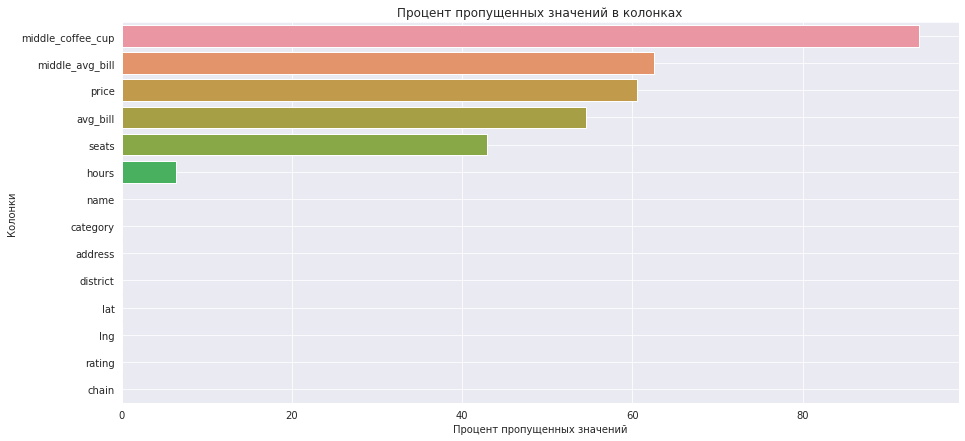

In [5]:
sns.set_style('dark') # выбираем стиль сетки
sns.set_palette('muted') # выбираем стиль палитры
plt.figure(figsize=(15, 7)) # назначаем размер графика

# строим график
sns.barplot(y=df_temp.index, x=df_temp.values, orient='h')

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Процент пропущенных значений в колонках')
plt.xlabel('Процент пропущенных значений')
plt.ylabel('Колонки')

# plt.xticks(rotation=45) # поворачиваем подписи значений
# plt.yticks(rotation=45) # поворачиваем подписи значений

# plt.xlim(0, 600) # ограничиваем ось X для наглядности
# plt.ylim(0, 5000) # ограничиваем ось X для наглядности

#plt.legend() # легенда # plt.legend(loc='lower right', fontsize=10)
plt.grid() # добавляем сетку
plt.show() # отображаем график на экране

##### Выводы:
1. Пропуски присутствуют в столбцах:
    1. middle_coffee_cup - число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
    2. middle_avg_bill - число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
    3. price - категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
    4. avg_bill - строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
    5. seats - количество посадочных мест.              
    6. hours - информация о днях и часах работы;
2. Все пропуски оставим без изменений. Заполнить значения пропусков нет возможности.

#### Проверка дубликатов:

In [6]:
display('Количество полных дубликатов в данных:')
display(df.duplicated().sum())

'Количество полных дубликатов в данных:'

0

In [7]:
df.head(2)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0


#### Колонки name — название заведения и address — адрес заведения приведем к строчному регистру

In [8]:
df['name'] = df['name'].str.lower()
df['address'] = df['address'].str.lower()

#### Проверим на неявные дубликаты колонку: 
1. category — категория заведения, например «кафе», «пиццерия» или «кофейня»
2. district — административный район, в котором находится заведение, например Центральный административный округ;

In [9]:
df['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [10]:
df['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

##### Отсутствуют не явные дубликаты в колонках:
	1. category — категория заведения, например «кафе», «пиццерия» или «кофейня»
	2. district — административный район, в котором находится заведение, например Центральный административный округ;

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


#### Приведем к строчному виду колонку hours — информация о днях и часах работы, узнаем как много разных значений в колонке и выведем самые популярные часы работы заведений

In [12]:
df['hours'] = df['hours'].str.lower()
display('Уникальных значений колонки: hours:')
display(len(df['hours'].unique()))
display('Топ 10 самых популярные значения колонки hours:')
df['hours'].value_counts().head(10)

'Уникальных значений колонки: hours:'

1308

'Топ 10 самых популярные значения колонки hours:'

ежедневно, 10:00–22:00      759
ежедневно, круглосуточно    730
ежедневно, 11:00–23:00      396
ежедневно, 10:00–23:00      310
ежедневно, 12:00–00:00      254
ежедневно, 09:00–21:00      204
ежедневно, 09:00–22:00      184
ежедневно, 12:00–23:00      178
ежедневно, 08:00–23:00      160
ежедневно, 08:00–22:00      148
Name: hours, dtype: int64

#### Оценим значения в колонках 
1. lat — широта географической точки, в которой находится заведение;
2. lng — долгота географической точки, в которой находится заведение;
3. rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);

In [13]:
df['lat'].describe()

count    8406.000000
mean       55.750109
std         0.069658
min        55.573942
25%        55.705155
50%        55.753425
75%        55.795041
max        55.928943
Name: lat, dtype: float64

In [14]:
df['lng'].describe()

count    8406.000000
mean       37.608570
std         0.098597
min        37.355651
25%        37.538583
50%        37.605246
75%        37.664792
max        37.874466
Name: lng, dtype: float64

In [15]:
df['rating'].describe()

count    8406.000000
mean        4.229895
std         0.470348
min         1.000000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

#### Приведем к строчному виду колонку price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее; выведем виды категорий цен в заведениях и посмотрим каких категорий больше.

In [16]:
df['price'] = df['price'].str.lower()
display('Уникальных значений колонки: price:')
display(df['price'].unique())
display(df['price'].value_counts())

'Уникальных значений колонки: price:'

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

средние          2117
выше среднего     564
высокие           478
низкие            156
Name: price, dtype: int64

#### Приведем к строчному виду колонку avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например: узнаем как много разных значений в колонке и выведем самые популярные

In [17]:
df['avg_bill'] = df['avg_bill'].str.lower()
display('Топ 10 самых популярные значения колонки avg_bill:')
display(df['avg_bill'].value_counts().head(10))
display('Уникальных значений avg_bill:')
display(len(df['avg_bill'].unique()))

'Топ 10 самых популярные значения колонки avg_bill:'

средний счёт:1000–1500 ₽         241
средний счёт:1500–2000 ₽         120
средний счёт:300–500 ₽            90
средний счёт:500–1000 ₽           78
средний счёт:1500–2500 ₽          68
средний счёт:700–1000 ₽           50
средний счёт:от 1500 ₽            48
средний счёт:1000 ₽               43
средний счёт:1000–2000 ₽          43
цена чашки капучино:239–274 ₽     43
Name: avg_bill, dtype: int64

'Уникальных значений avg_bill:'

898

#### Оценим значения колонки middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»

In [18]:
df['middle_avg_bill'].describe(percentiles=[0.01, 0.25, 0.5, 0.75, 0.99])

count     3149.000000
mean       958.053668
std       1009.732845
min          0.000000
1%         140.000000
25%        375.000000
50%        750.000000
75%       1250.000000
99%       3750.000000
max      35000.000000
Name: middle_avg_bill, dtype: float64

In [19]:
# Посмотрим значения 0
df[df['middle_avg_bill'] < 50]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
3688,кофемания,кофейня,"москва, улица новый арбат, 19",Центральный административный округ,"ежедневно, круглосуточно",55.752136,37.587784,4.5,высокие,средний счёт:от 0 ₽,0.0,NaN,1,200.0
7545,шаурмян у арена,быстрое питание,"москва, краснодарская улица, 47",Юго-Восточный административный округ,"ежедневно, 09:00–23:00",55.677744,37.764810,3.3,NaN,средний счёт:от 30 ₽,30.0,NaN,0,2.0


In [20]:
# удалим нулевое значение как анамалию
df = df[df['middle_avg_bill'] != 0]

In [21]:
df.head(2)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0


#### Оценим значения колонки middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:»

In [22]:
df['middle_coffee_cup'].describe(percentiles=[0.01, 0.25, 0.5, 0.75, 0.99])

count     535.000000
mean      174.721495
std        88.951103
min        60.000000
1%         60.000000
25%       124.500000
50%       169.000000
75%       225.000000
99%       309.900000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

In [23]:
df[df['middle_coffee_cup'] > 400] # ошибка скорее всего должно быть в колонке 230-290 цена чашки каппучино

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2859,шоколадница,кофейня,"москва, большая семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,цена чашки капучино:230–2907 ₽,NaN,1568.0,1,48.0


In [24]:
# Заменим ошибочное значение на 260
df.loc[df['middle_coffee_cup'] > 400, 'middle_coffee_cup'] = 260

#### Оценим значения колонки chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
- 0 — заведение не является сетевым
- 1 — заведение является сетевым

In [25]:
display(df['chain'].value_counts())

0    5201
1    3204
Name: chain, dtype: int64

#### Оценим значения колонки seats — количество посадочных мест.

In [26]:
df.head(2)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0


In [27]:
display(df['seats'].describe(percentiles=[0.01, 0.25, 0.5, 0.75, 0.99]))

count    4794.000000
mean      108.402587
std       122.839086
min         0.000000
1%          0.000000
25%        40.000000
50%        75.000000
75%       140.000000
99%       625.000000
max      1288.000000
Name: seats, dtype: float64

In [28]:
display(df[df['seats'] == 0].head(10))

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
84,meat doner kebab,булочная,"москва, улица лескова, 22",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.896987,37.608126,4.5,NaN,средний счёт:300 ₽,300.0,NaN,0,0.0
177,арамье,булочная,"москва, улица 800-летия москвы, 22, корп. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.879392,37.556832,4.0,NaN,NaN,NaN,NaN,1,0.0
196,донер-шашлык,ресторан,"москва, улица лескова, 22",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.896962,37.608300,4.5,NaN,NaN,NaN,NaN,0,0.0
203,тандыр № 1,кафе,"москва, улица лескова, 22г",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.895615,37.611049,4.0,NaN,NaN,NaN,NaN,1,0.0
211,неаполитан пицца,кафе,"москва, улица пришвина, 23",Северо-Восточный административный округ,"ежедневно, 12:00–23:00",55.885416,37.604650,4.3,NaN,NaN,NaN,NaN,0,0.0
266,пекарня&донер,булочная,"москва, широкая улица, 21",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.887751,37.672475,4.1,NaN,NaN,NaN,NaN,0,0.0
284,центр плов,кафе,"москва, широкая улица, 16а",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.887348,37.662315,4.2,NaN,NaN,NaN,NaN,0,0.0
290,шаурма,кафе,"москва, осташковская улица, 7, корп. 1",Северо-Восточный административный округ,NaN,55.877350,37.679414,3.3,NaN,NaN,NaN,NaN,0,0.0
306,everest coffee,кофейня,"москва, сходненская улица, 50",Северо-Западный административный округ,"пн-чт 08:00–22:00; пт 08:00–23:00; сб,вс 09:00...",55.847770,37.440586,4.9,средние,цена чашки капучино:200–300 ₽,NaN,250.0,0,0.0
337,пекарня маковка,пиццерия,"москва, сходненская улица, 35, корп. 1",Северо-Западный административный округ,"ежедневно, 08:00–22:00",55.848505,37.439135,4.9,NaN,NaN,NaN,NaN,0,0.0


In [29]:
display(df[df['seats'] > 1000].head(10))

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2713,ваня и гоги,"бар,паб","москва, измайловское шоссе, 71, корп. а",Восточный административный округ,"ежедневно, 11:00–06:00",55.789842,37.750282,4.2,высокие,средний счёт:1000–2500 ₽,1750.0,NaN,0,1040.0
2722,маргарита,быстрое питание,"москва, измайловское шоссе, 71, корп. а",Восточный административный округ,"ежедневно, 10:00–22:00",55.789527,37.752004,4.3,NaN,NaN,NaN,NaN,1,1040.0
2770,шоколадница,кофейня,"москва, измайловское шоссе, 71, корп. а",Восточный административный округ,"пн-ср 11:00–23:00; чт 11:00–00:00; пт,сб 11:00...",55.789903,37.749822,4.1,NaN,NaN,NaN,NaN,1,1040.0
2966,матрешка,кафе,"москва, измайловское шоссе, 71, корп. а",Восточный административный округ,NaN,55.789867,37.749656,4.0,NaN,NaN,NaN,NaN,0,1040.0
4231,рестобар argomento,столовая,"москва, кутузовский проспект, 41, стр. 1",Западный административный округ,"ежедневно, 12:00–23:00",55.738237,37.531819,4.2,высокие,средний счёт:2500–5000 ₽,3750.0,NaN,0,1200.0
6518,delonixcafe,ресторан,"москва, проспект вернадского, 94, корп. 1",Западный административный округ,"ежедневно, круглосуточно",55.652577,37.475730,4.1,высокие,средний счёт:1500–2000 ₽,1750.0,NaN,0,1288.0
6524,ян примус,ресторан,"москва, проспект вернадского, 121, корп. 1",Западный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 12:00...",55.657166,37.481519,4.5,выше среднего,средний счёт:1500 ₽,1500.0,NaN,1,1288.0
6574,мюнгер,пиццерия,"москва, проспект вернадского, 97, корп. 1",Западный административный округ,"пн-пт 08:00–21:00; сб,вс 10:00–21:00",55.667505,37.491001,4.8,NaN,NaN,NaN,NaN,1,1288.0
6641,one price coffee,кофейня,"москва, проспект вернадского, 84, стр. 1",Западный административный округ,"ежедневно, 08:30–20:00",55.665129,37.478635,4.3,NaN,NaN,NaN,NaN,1,1288.0
6658,гудбар,"бар,паб","москва, проспект вернадского, 97, корп. 1",Западный административный округ,"пн-пт 11:00–23:00; сб,вс 13:00–23:00",55.667327,37.490601,4.1,средние,средний счёт:700 ₽,700.0,NaN,0,1288.0


#### Создайте столбец street с названиями улиц из столбца с адресом.

In [30]:
df['street'] = df['address'].str.split(',').str[1].str.strip()

In [31]:
df['street'].value_counts().head(20)

проспект мира             184
профсоюзная улица         122
проспект вернадского      108
ленинский проспект        107
ленинградский проспект     95
дмитровское шоссе          88
каширское шоссе            77
варшавское шоссе           76
ленинградское шоссе        70
мкад                       65
люблинская улица           60
улица вавилова             55
кутузовский проспект       54
улица миклухо-маклая       49
пятницкая улица            48
алтуфьевское шоссе         47
измайловское шоссе         44
пресненская набережная     44
проспект андропова         42
волгоградский проспект     42
Name: street, dtype: int64

#### Создайте столбец is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):

In [32]:
df.loc[df['hours'] == "ежедневно, круглосуточно", 'total'] = True
df.loc[df['hours'] != "ежедневно, круглосуточно", 'total'] = False

In [33]:
df.head(2)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,total
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False


#### Выводы:
Общая информация о датасете:
1. Таблица содержит 8406 записей о заведениях общественного питания
2. В данных представлены столбцы с типом данных 
    - строковый тип 7 столбцов: name, category, address, district, hours, price, avg_bill
    - численный тип 6 столбцов: lat, lng, rating, middle_avg_bill, middle_coffee_cup, seats
    - целочисленный тип 1 стоблец: chain
3. В данных имеются пропуски в столбцах: hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats
4. Наименование колонок корректное.

Пропуски:
1. Пропуски присутствуют в столбцах:
    1. middle_coffee_cup - число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
    2. middle_avg_bill - число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
    3. price - категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
    4. avg_bill - строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
    5. seats - количество посадочных мест.              
    6. hours - информация о днях и часах работы;
2. Все пропуски оставим без изменений. Заполнить значения пропусков нет возможности.

Дубликаты: 
1. Количество полных дубликатов в данных: 0
2. Отсутствуют не явные дубликаты в колонках:
	1. category — категория заведения, например «кафе», «пиццерия» или «кофейня»
	2. district — административный район, в котором находится заведение, например Центральный административный округ;
3. Привели к строчному виду колонку hours — информация о днях и часах работы
4. Привели к строчному виду колонку price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
5. Приведем к строчному виду колонку avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона
6. Заменили ошибочные значения колонки middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill

Выполните предобработку данных:
1. Создали столбец street с названиями улиц из столбца с адресом.
2. Создайте столбец is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):



### Шаг 3. Анализ данных

#### Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.

In [34]:
df.head(2)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,total
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False


In [35]:
df_temp = df.pivot_table(index = 'category', values = 'name', aggfunc='count')
df_temp = df_temp.sort_values(by='name', ascending = False)
df_temp.columns = ['count']
df_temp

,count
category,
кафе,2378
ресторан,2043
кофейня,1412
"бар,паб",765
пиццерия,633
быстрое питание,603
столовая,315
булочная,256


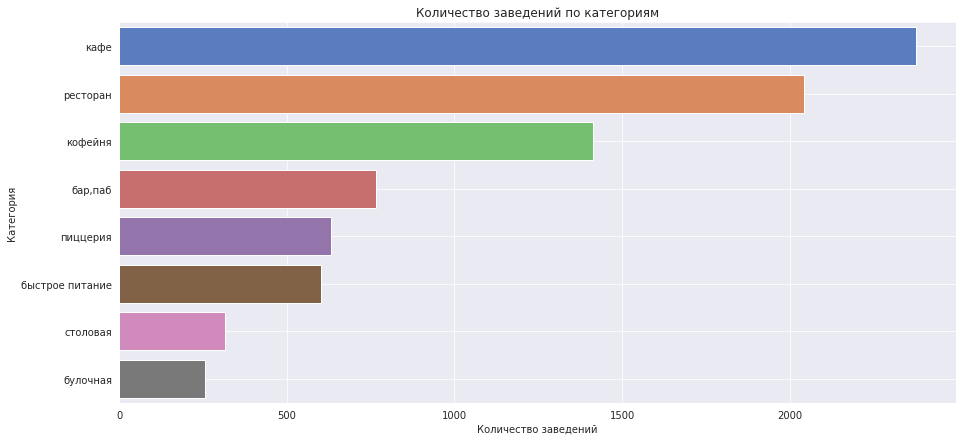

In [36]:
sns.set_style('dark') # выбираем стиль сетки
sns.set_palette('muted') # выбираем стиль палитры

plt.figure(figsize=(15, 7)) # назначаем размер графика

# строим столбчатый график средствами seaborn
sns.barplot(y=df_temp.index, x=df_temp['count'], orient='h')

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Количество заведений по категориям')
plt.ylabel('Категория')
plt.xlabel('Количество заведений')

# plt.xticks(rotation=45) # поворачиваем подписи значений
# plt.yticks(rotation=45) # поворачиваем подписи значений

# plt.xlim(0, 600) # ограничиваем ось X для наглядности
# plt.ylim(0, 5000) # ограничиваем ось X для наглядности

#plt.legend() # легенда # plt.legend(loc='lower right', fontsize=10)
plt.grid() # добавляем сетку
plt.show() # отображаем график на экране

##### Выводы:
1. Кафе (2378 шт), рестораны (2043 шт) и кофейни (1412 шт) самые распространённые типы заведений
2. В данных представлены так же бар,паб (765 шт), пиццерии (633 шт), заведения быстрого питания (603 шт), столовые (315 шт) и булочные(256 шт)

#### Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.

In [37]:
df_temp = df.groupby('category').agg({'seats': ['median', 'mean', 'min', 'max']})
df_temp.columns = ['median', 'mean', 'min', 'max']
df_temp = df_temp.sort_values(by = 'median', ascending = False)
df_temp

,median,mean,min,max
category,,,,
ресторан,86.0,121.944094,0.0,1288.0
"бар,паб",82.5,124.532051,0.0,1288.0
кофейня,80.0,111.081333,0.0,1288.0
столовая,75.5,99.750000,0.0,1200.0
быстрое питание,65.0,98.891117,0.0,1040.0
кафе,60.0,97.512315,0.0,1288.0
пиццерия,55.0,94.496487,0.0,1288.0
булочная,50.0,89.385135,0.0,625.0


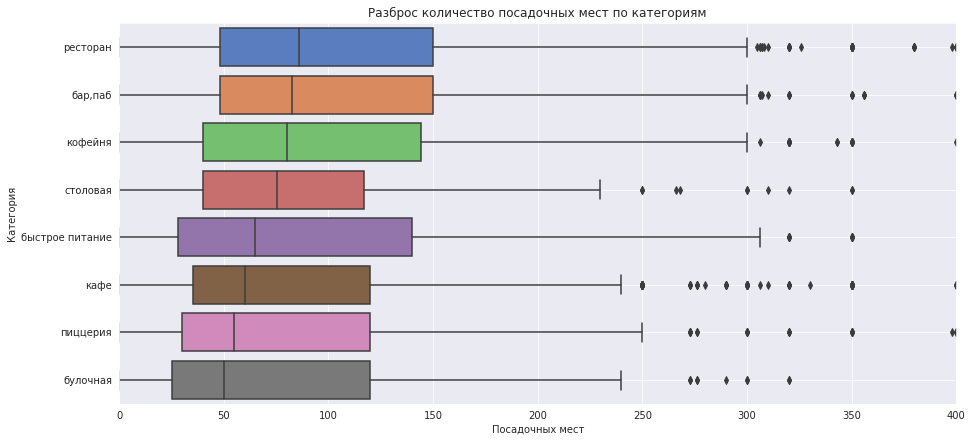

In [38]:
sns.set_style('dark') # выбираем стиль сетки
sns.set_palette('muted') # выбираем стиль палитры
plt.figure(figsize=(15, 7)) # назначаем размер графика

median_order = df.groupby('category')['seats'].median().sort_values(ascending = False).index.tolist()
# строим столбчатый график средствами seaborn
sns.boxplot(y='category', x='seats', data=df, orient = 'h', order=median_order)

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Разброс количество посадочных мест по категориям')
plt.xlabel('Посадочных мест')
plt.ylabel('Категория')

# plt.xticks(rotation=45) # поворачиваем подписи значений
# plt.yticks(rotation=45) # поворачиваем подписи значений

plt.xlim(0, 400) # ограничиваем ось X для наглядности
#plt.ylim(0, 400) # ограничиваем ось X для наглядности

#plt.legend() # легенда # plt.legend(loc='lower right', fontsize=10)
plt.grid() # добавляем сетку
plt.show() # отображаем график на экране

##### Выводы:
Используя медиану(так как устойчива к выбросам) количества посадочных мест в каждой категории.
По графику и таблице, распределим заведения количеству посадочных мест:
1. Самые вместительные: рестораны, бары/пабы, кофейни. 
2. Средний уровень: столовые, рестораны быстрого питания, кафе.
3. Самые компактные заведения: пиццерии и булочные


#### Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?

In [39]:
df_temp = df.groupby('chain').agg({'name': 'count'})
df_temp.columns = ['count']
df_temp['per'] = round(df_temp['count'] / df_temp['count'].sum() * 100 , 2)
#df_temp.index = ['несетевой', 'сетевой']
df_temp['legend'] = ['несетевое', 'сетевое']
df_temp

,count,per,legend
chain,,,
0,5201,61.88,несетевое
1,3204,38.12,сетевое


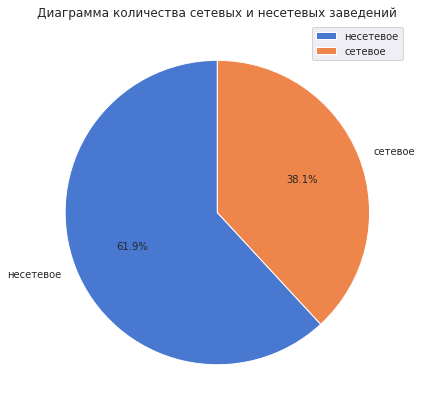

In [40]:
sns.set_style('dark') # выбираем стиль сетки
sns.set_palette('muted') # выбираем стиль палитры
plt.figure(figsize=(15, 7)) # назначаем размер графика

# строим столбчатый график средствами seaborn
plt.pie(df_temp['per'], labels=df_temp['legend'], autopct='%1.1f%%', startangle=90)

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Диаграмма количества сетевых и несетевых заведений')

# plt.xticks(rotation=45) # поворачиваем подписи значений
# plt.yticks(rotation=45) # поворачиваем подписи значений

# plt.xlim(0, 600) # ограничиваем ось X для наглядности
# plt.ylim(0, 5000) # ограничиваем ось X для наглядности

plt.legend() # легенда # plt.legend(loc='lower right', fontsize=10)
plt.grid() # добавляем сетку
plt.show() # отображаем график на экране

##### Выводы:
1. Большее количество заведений не сетевые. Занимают долю 61,9 процентов (5201 Шт)
2. Сетевые заведения занимают долю 38,1 %

#### Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.

In [41]:
# df_temp = df.groupby(['category','chain'])['name'].count().unstack()
df_temp = df.pivot_table(index = 'category', values = 'name', columns = 'chain' , aggfunc = 'count')
#display(df_temp)
df_temp.columns = ['no','yes']
df_temp['total'] = df_temp['no'] + df_temp['yes']
df_temp['per_chain_yes'] = round(df_temp['yes']/df_temp['total'] * 100 , 2)
df_temp['per_chain_no'] = round(df_temp['no']/df_temp['total'] * 100 , 2)
df_temp = df_temp.sort_values(by = 'per_chain_yes', ascending = False)


df_temp = df_temp[['per_chain_yes','per_chain_no']]

df_temp

,per_chain_yes,per_chain_no
category,,
булочная,61.33,38.67
пиццерия,52.13,47.87
кофейня,50.92,49.08
быстрое питание,38.47,61.53
ресторан,35.73,64.27
кафе,32.76,67.24
столовая,27.94,72.06
"бар,паб",22.09,77.91


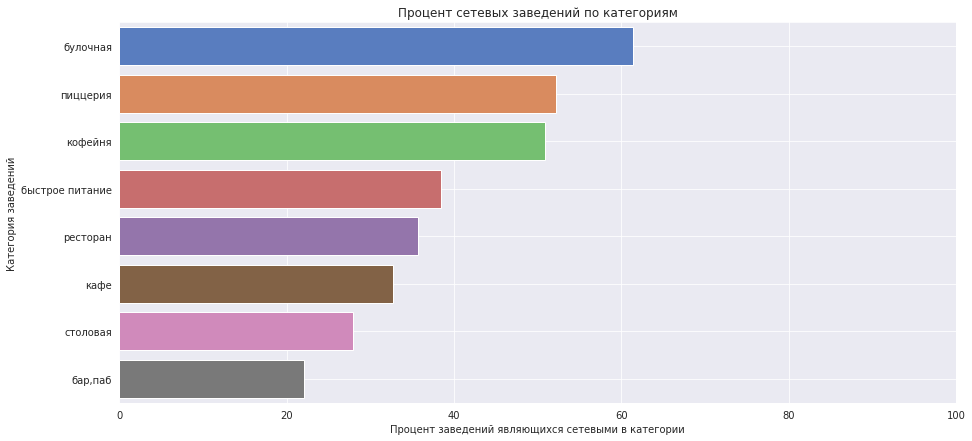

In [42]:
sns.set_style('dark') # выбираем стиль сетки
sns.set_palette('muted') # выбираем стиль палитры
plt.figure(figsize=(15, 7)) # назначаем размер графика

# строим столбчатый график средствами seaborn
sns.barplot(y=df_temp.index, x='per_chain_yes', data=df_temp, orient='h')

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Процент сетевых заведений по категориям')
plt.xlabel('Процент заведений являющихся сетевыми в категории')
plt.ylabel('Категория заведений')

# plt.xticks(rotation=45) # поворачиваем подписи значений
# plt.yticks(rotation=45) # поворачиваем подписи значений

plt.xlim(0, 100) # ограничиваем ось X для наглядности
#plt.ylim(0, 100) # ограничиваем ось X для наглядности

#plt.legend() # легенда # plt.legend(loc='lower right', fontsize=10)
plt.grid() # добавляем сетку
plt.show() # отображаем график на экране

<Figure size 1080x504 with 0 Axes>

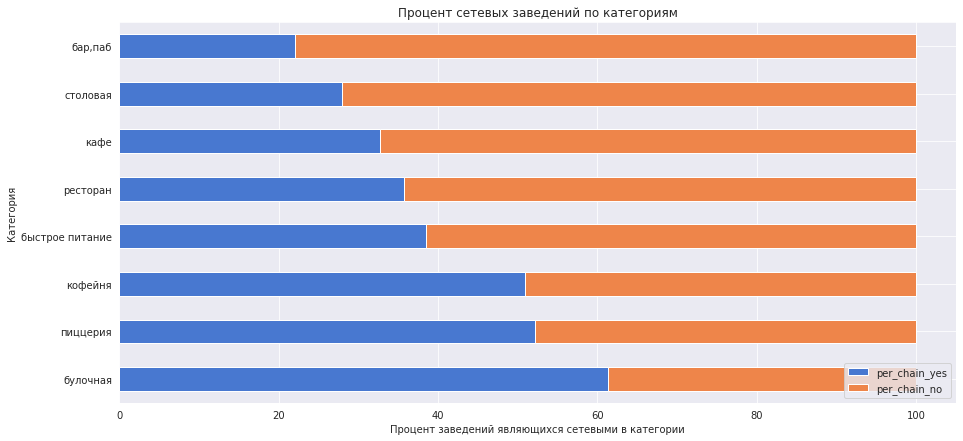

In [43]:
sns.set_style('dark') # выбираем стиль сетки
sns.set_palette('muted') # выбираем стиль палитры

plt.figure(figsize=(15, 7)) # назначаем размер графика

# строим столбчатый график средствами seaborn
df_temp.plot.barh(stacked=True, figsize=(15, 7))

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Процент сетевых заведений по категориям')
plt.xlabel('Процент заведений являющихся сетевыми в категории')
plt.ylabel('Категория')

# plt.xticks(rotation=45) # поворачиваем подписи значений
# plt.yticks(rotation=45) # поворачиваем подписи значений

# plt.xlim(0, 600) # ограничиваем ось X для наглядности
# plt.ylim(0, 5000) # ограничиваем ось X для наглядности

plt.legend(loc='lower right') # легенда # plt.legend(, fontsize=10)
plt.grid() # добавляем сетку
plt.show() # отображаем график на экране


##### Выводы:
1. Булочные — лидер по доле сетевых заведений (61.3%)
2. Пиццерии и кофейни примерно одинаковое количество сетевых и несетевых заведений 
2. Кафе, рестораны и бары чаще являются несетевыми.

#### Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?

In [44]:
df_temp = df.query('chain == 1').pivot_table(index = 'name', values='category', aggfunc = ['count','first'])
df_temp.columns = ['count', 'category']
df_temp = df_temp.sort_values(by='count', ascending = False)
df_temp = df_temp.head(15)
df_temp

,count,category
name,,
шоколадница,120,кофейня
домино'с пицца,76,пиццерия
додо пицца,74,пиццерия
one price coffee,71,кофейня
яндекс лавка,69,ресторан
cofix,65,кофейня
prime,50,ресторан
хинкальная,44,быстрое питание
кофепорт,42,кофейня


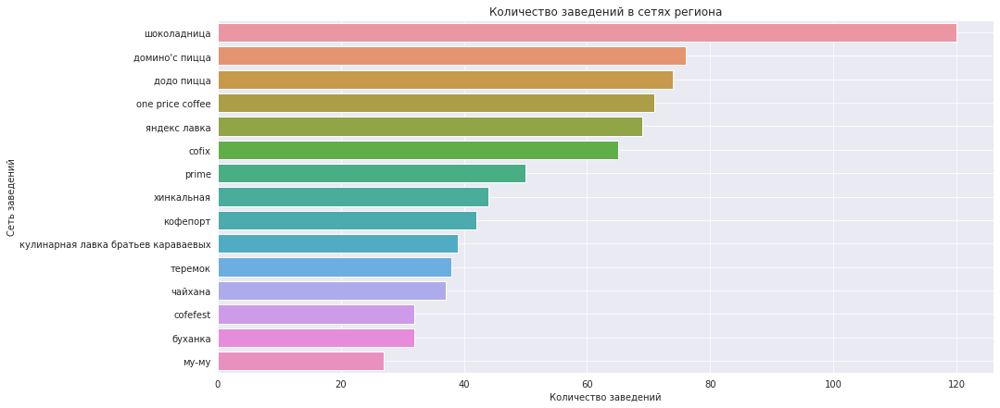

In [47]:
sns.set_style('dark') # выбираем стиль сетки
sns.set_palette('muted') # выбираем стиль палитры
plt.figure(figsize=(15, 7)) # назначаем размер графика

# строим столбчатый график средствами seaborn
sns.barplot(y=df_temp.index, x='count', data=df_temp, orient='h')

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Количество заведений в сетях региона')
plt.xlabel('Количество заведений')
plt.ylabel('Сеть заведений')

# plt.xticks(rotation=45) # поворачиваем подписи значений
# plt.yticks(rotation=45) # поворачиваем подписи значений

# plt.xlim(0, 600) # ограничиваем ось X для наглядности
# plt.ylim(0, 5000) # ограничиваем ось X для наглядности

#plt.legend() # легенда # plt.legend(loc='lower right', fontsize=10)
plt.grid() # добавляем сетку
plt.show() # отображаем график на экране

In [48]:
df_temp

,count,category
name,,
шоколадница,120,кофейня
домино'с пицца,76,пиццерия
додо пицца,74,пиццерия
one price coffee,71,кофейня
яндекс лавка,69,ресторан
cofix,65,кофейня
prime,50,ресторан
хинкальная,44,быстрое питание
кофепорт,42,кофейня


In [50]:
df_temp2 = df_temp.pivot_table(index = 'category', values='count', aggfunc = 'count').sort_values(by = 'count',ascending=False)
df_temp2

,count
category,
кофейня,5
кафе,3
ресторан,3
пиццерия,2
булочная,1
быстрое питание,1


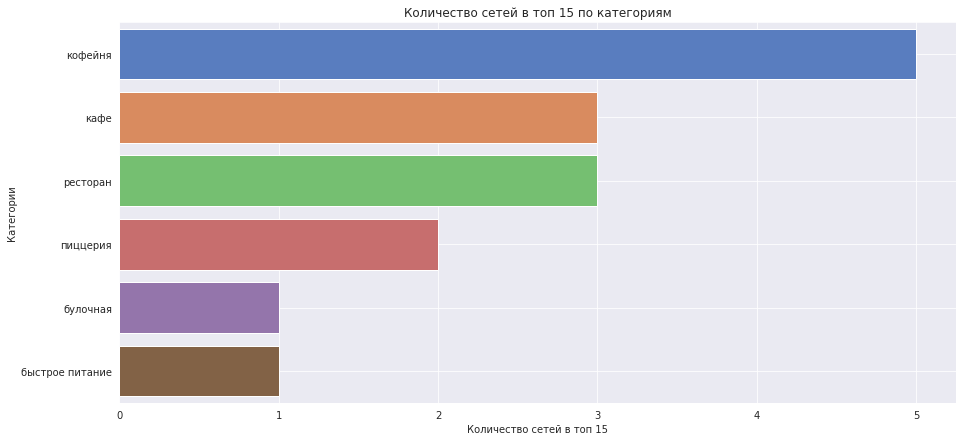

In [51]:
sns.set_style('dark') # выбираем стиль сетки
sns.set_palette('muted') # выбираем стиль палитры
plt.figure(figsize=(15, 7)) # назначаем размер графика

# строим столбчатый график средствами seaborn
sns.barplot(y=df_temp2.index, x='count', data=df_temp2, orient='h')

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Количество сетей в топ 15 по категориям')
plt.xlabel('Количество сетей в топ 15')
plt.ylabel('Категории')

# plt.xticks(rotation=45) # поворачиваем подписи значений
# plt.yticks(rotation=45) # поворачиваем подписи значений

# plt.xlim(0, 600) # ограничиваем ось X для наглядности
# plt.ylim(0, 5000) # ограничиваем ось X для наглядности

#plt.legend() # легенда # plt.legend(loc='lower right', fontsize=10)
plt.grid() # добавляем сетку
plt.show() # отображаем график на экране

##### Вывод:
1. Самые популярные франшизы: Шоколадница, домино с пицца, до-до пицца, one price coffee, яндекс лавка
2. Кофейни лидируют в топе сетевых заведений.
3. Кафе, рестораны и пиццерии занимают среднее положение в топе сетевых заведений.
4. Булочные и быстрое питание встречаются по 1 сети в топе сетевых заведений

#### Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [52]:
df_temp = df.pivot_table(index = 'district', values = 'name', columns = 'category', aggfunc = 'count')
df_temp = df_temp.sort_values(by = 'Центральный административный округ', axis = 1, ascending = False)
df_temp = df_temp.sort_values(by = 'бар,паб')
df_temp['total'] = df_temp.sum(axis=1)
df_temp

category,ресторан,кафе,кофейня,"бар,паб",пиццерия,быстрое питание,столовая,булочная,total
district,,,,,,,,,
Северо-Западный административный округ,109,115,62,23,40,30,18,12,409
Юго-Восточный административный округ,145,282,89,38,55,67,25,13,714
Юго-Западный административный округ,168,238,96,38,64,61,17,27,709
Западный административный округ,218,239,150,50,71,62,24,37,851
Восточный административный округ,160,272,105,53,72,71,40,25,798
Северо-Восточный административный округ,182,269,159,63,68,82,40,28,891
Северный административный округ,189,235,193,68,77,58,41,39,900
Южный административный округ,202,264,131,68,73,85,44,25,892
Центральный административный округ,670,464,427,364,113,87,66,50,2241


<Figure size 1080x504 with 0 Axes>

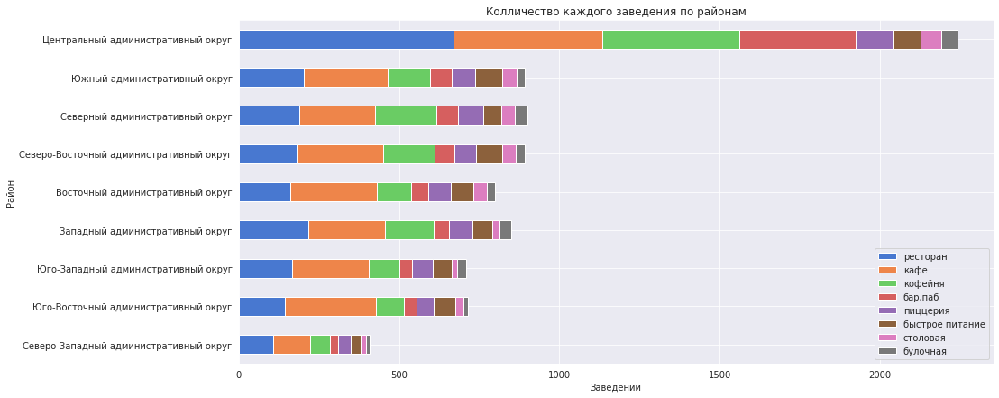

In [53]:
sns.set_style('dark') # выбираем стиль сетки
sns.set_palette('muted') # выбираем стиль палитры

plt.figure(figsize=(15, 7)) # назначаем размер графика

# строим столбчатый график средствами seaborn
df_temp = df_temp.drop('total', axis=1)
df_temp.plot.barh(stacked=True, figsize=(15, 7))

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Колличество каждого заведения по районам')
plt.xlabel('Заведений')
plt.ylabel('Район')

# plt.xticks(rotation=45) # поворачиваем подписи значений
# plt.yticks(rotation=45) # поворачиваем подписи значений

# plt.xlim(0, 600) # ограничиваем ось X для наглядности
# plt.ylim(0, 5000) # ограничиваем ось X для наглядности

plt.legend(loc='lower right') # легенда # plt.legend(, fontsize=10)
plt.grid() # добавляем сетку
plt.show() # отображаем график на экране


In [54]:
df_temp = df.pivot_table(index = 'district', values = 'name', columns = 'category', aggfunc = 'count')
df_temp = df_temp.sort_values(by = 'Центральный административный округ', axis = 1, ascending = False)
df_temp = df_temp.sort_values(by = 'бар,паб')
df_temp['total'] = df_temp.sum(axis=1)
df_temp = df_temp.sort_values(by = 'total', ascending = False)
df_temp

category,ресторан,кафе,кофейня,"бар,паб",пиццерия,быстрое питание,столовая,булочная,total
district,,,,,,,,,
Центральный административный округ,670,464,427,364,113,87,66,50,2241
Северный административный округ,189,235,193,68,77,58,41,39,900
Южный административный округ,202,264,131,68,73,85,44,25,892
Северо-Восточный административный округ,182,269,159,63,68,82,40,28,891
Западный административный округ,218,239,150,50,71,62,24,37,851
Восточный административный округ,160,272,105,53,72,71,40,25,798
Юго-Восточный административный округ,145,282,89,38,55,67,25,13,714
Юго-Западный административный округ,168,238,96,38,64,61,17,27,709
Северо-Западный административный округ,109,115,62,23,40,30,18,12,409


##### Вывод:
1. Лидер: Центральный административный округ (ЦАО) – 2241 заведение (почти в 2.5 раза больше, чем у ближайшего конкурента).
2. Аутсайдер: Северо-Западный административный округ (СЗАО) – всего 409 заведений (почти в 5.5 раз меньше, чем в ЦАО).
3. Остальные округи так сильно не отличаются от 709 до 900 заведений


#### Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

In [55]:
df_temp = df.pivot_table(index = 'category', values = 'rating', aggfunc = 'mean')
df_temp = df_temp.sort_values(by = 'rating', ascending=False)
df_temp

,rating
category,
"бар,паб",4.387712
пиццерия,4.301264
ресторан,4.290357
кофейня,4.277125
булочная,4.268359
столовая,4.211429
кафе,4.123886
быстрое питание,4.050249


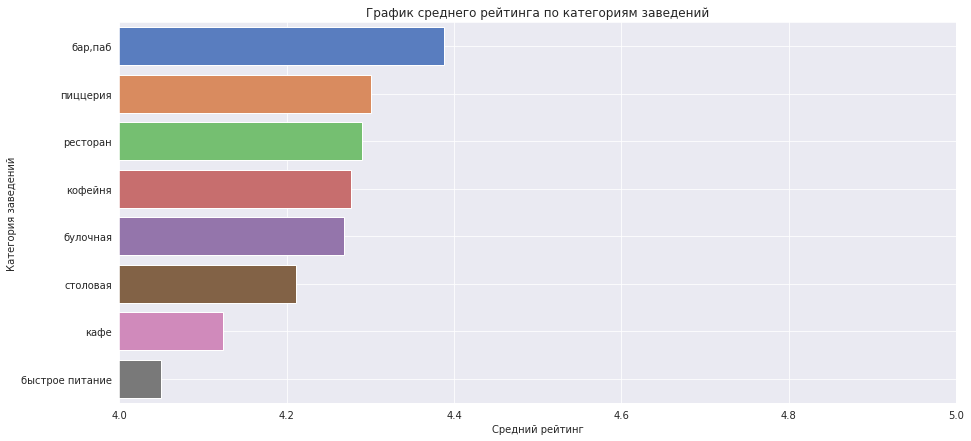

In [56]:
sns.set_style('dark') # выбираем стиль сетки
sns.set_palette('muted') # выбираем стиль палитры
plt.figure(figsize=(15, 7)) # назначаем размер графика

# строим столбчатый график средствами seaborn
sns.barplot(y=df_temp.index, x='rating', data=df_temp, orient='h')

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('График среднего рейтинга по категориям заведений')
plt.xlabel('Средний рейтинг')
plt.ylabel('Категория заведений')

# plt.xticks(rotation=45) # поворачиваем подписи значений
# plt.yticks(rotation=45) # поворачиваем подписи значений

plt.xlim(4, 5) # ограничиваем ось X для наглядности
# plt.ylim(0, 5000) # ограничиваем ось X для наглядности

#plt.legend() # легенда # plt.legend(loc='lower right', fontsize=10)
plt.grid() # добавляем сетку
plt.show() # отображаем график на экране

##### Вывод:
1. Средний рейтинг заведений всех категорий более 4
2. Самый высокий средний рейтинг имеют заведения бар,паб.
3. Среднее место по среднему рейтингу занимают: пиццерия, ресторан, кофейня, булочная, столовая
4. Аутсайдерами по средниему рейтингу являются: кафе, быстрое питание

#### Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson (скачать файл для локальной работы).

In [57]:
rating_df = df.groupby('district', as_index=False)['rating'].agg('median')
rating_df

# подключаем модуль для работы с JSON-форматом
import json

# читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)
    
#print(json.dumps(geo_json, indent=2, ensure_ascii=False, sort_keys=True))
    
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

In [58]:
rating_df = rating_df.sort_values(by = 'rating', ascending = False)
rating_df

,district,rating
5,Центральный административный округ,4.4
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
4,Северо-Западный административный округ,4.3
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3
3,Северо-Восточный административный округ,4.2
6,Юго-Восточный административный округ,4.2


##### Вывод: 
1. Лидером по рейтингу является Центральный административный округ	
2. Последние места занимают: Северо-Восточный административный округ, Юго-Восточный административный округ

#### Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [59]:
df.head(2)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,total
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False


In [60]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']}",# {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

#### Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [61]:
df_temp = df.pivot_table(index = 'street', values = 'name', aggfunc = 'count')
df_temp = df_temp.sort_values(by = 'name' , ascending = False).head(15)
display(df_temp)
df_temp = df.query('street in @df_temp.index').pivot_table(index = 'street', values = 'name', columns = 'category', aggfunc = 'count')
df_temp = df_temp.sort_values(by = 'проспект мира',axis = 1 , ascending= False)
df_temp = df_temp.sort_values(by = 'кафе' , ascending= False)
df_temp['total'] = df_temp.sum(axis=1)
df_temp =  df_temp.sort_values(by = 'total')

df_temp

,name
street,
проспект мира,184
профсоюзная улица,122
проспект вернадского,108
ленинский проспект,107
ленинградский проспект,95
дмитровское шоссе,88
каширское шоссе,77
варшавское шоссе,76
ленинградское шоссе,70


category,кафе,ресторан,кофейня,быстрое питание,"бар,паб",пиццерия,булочная,столовая,total
street,,,,,,,,,
пятницкая улица,7.0,18.0,6.0,2.0,9.0,3.0,3.0,NaN,48.0
улица миклухо-маклая,21.0,15.0,4.0,4.0,3.0,2.0,NaN,NaN,49.0
кутузовский проспект,14.0,16.0,13.0,2.0,2.0,3.0,1.0,3.0,54.0
улица вавилова,15.0,12.0,10.0,11.0,2.0,3.0,2.0,NaN,55.0
люблинская улица,26.0,10.0,11.0,5.0,5.0,1.0,NaN,2.0,60.0
мкад,45.0,5.0,4.0,9.0,1.0,NaN,NaN,1.0,65.0
ленинградское шоссе,13.0,26.0,13.0,5.0,5.0,3.0,2.0,3.0,70.0
варшавское шоссе,18.0,20.0,14.0,7.0,6.0,4.0,NaN,7.0,76.0
каширское шоссе,20.0,19.0,16.0,10.0,2.0,5.0,NaN,5.0,77.0


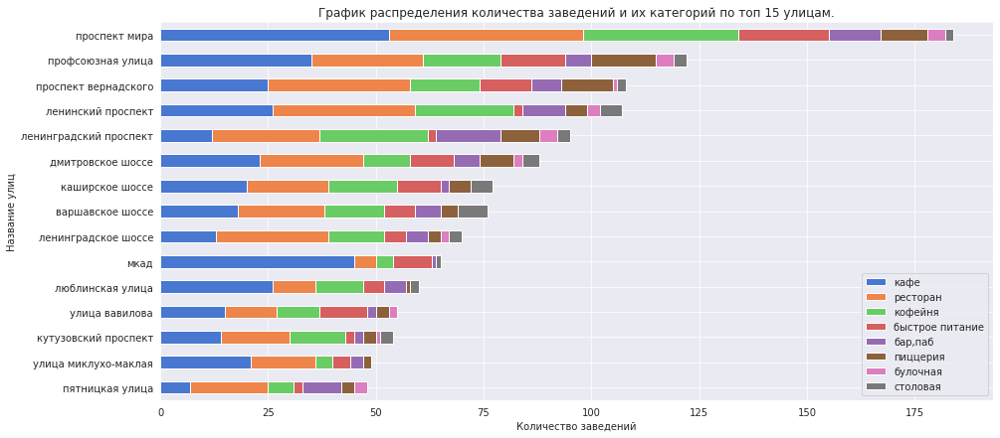

In [62]:
sns.set_style('dark') # выбираем стиль сетки
sns.set_palette('muted') # выбираем стиль палитры

#plt.figure(figsize=(15, 7)) # назначаем размер графика

# строим столбчатый график средствами seaborn
df_temp = df_temp.drop('total', axis=1)
df_temp.plot.barh(stacked=True, figsize=(15, 7))

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('График распределения количества заведений и их категорий по топ 15 улицам.')
plt.xlabel('Количество заведений')
plt.ylabel('Название улиц')

# plt.xticks(rotation=45) # поворачиваем подписи значений
# plt.yticks(rotation=45) # поворачиваем подписи значений

# plt.xlim(0, 600) # ограничиваем ось X для наглядности
# plt.ylim(0, 5000) # ограничиваем ось X для наглядности

plt.legend(loc='lower right') # легенда # plt.legend(, fontsize=10)
plt.grid() # добавляем сетку
plt.show() # отображаем график на экране


##### Вывод:
1. Кафе лидирует на большенстве улицах
2. Так же в популярная категория заведений: рестораны и кафе.
3. Проспект Мира – лидер по количеству заведений
4. На МКАДе самые популярные заведения кафе (45 заведений из 65)


#### Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [63]:
df.head(2)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,total
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False


In [64]:
display('Всего улиц в датасете')
len(df['street'].unique())

'Всего улиц в датасете'

1447

In [65]:
df_temp = df.pivot_table(index = 'street', values = 'name', aggfunc = 'count')
df_temp = df_temp.sort_values(by='name', ascending = False)
display(df_temp)
display('количество улиц с 1 объектом общепита: ', len(df_temp.query('name == 1')))
df_temp.value_counts().head(10)

,name
street,
проспект мира,184
профсоюзная улица,122
проспект вернадского,108
ленинский проспект,107
ленинградский проспект,95
...,...
островная улица,1
отрадный проезд,1
павелецкая набережная,1


'количество улиц с 1 объектом общепита: '

457

name
1       457
2       247
3       156
4       110
5        94
6        58
7        45
8        34
9        31
10       23
dtype: int64

No handles with labels found to put in legend.


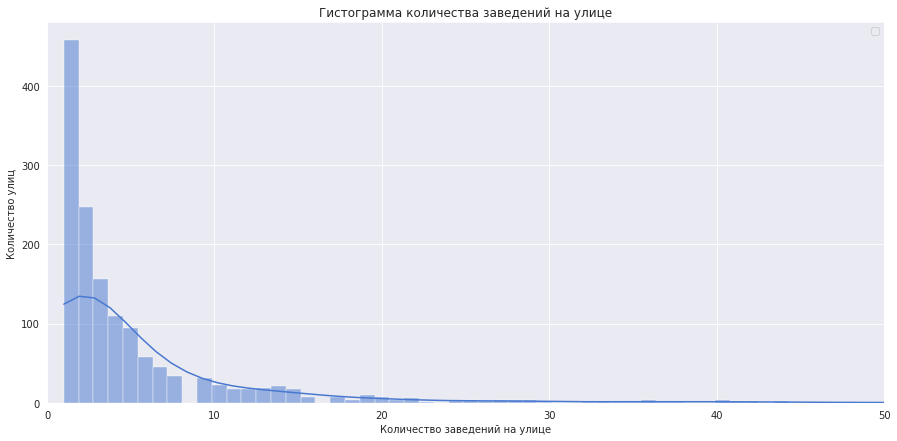

In [66]:
sns.set_style('dark') # выбираем стиль сетки
sns.set_palette('muted') # выбираем стиль палитры
plt.figure(figsize=(15, 7)) # назначаем размер графика

# строим столбчатый график средствами seaborn
sns.histplot(x='name', data=df_temp, kde=True)

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Гистограмма количества заведений на улице')
plt.xlabel('Количество заведений на улице')
plt.ylabel('Количество улиц')

# plt.xticks(rotation=45) # поворачиваем подписи значений
# plt.yticks(rotation=45) # поворачиваем подписи значений

plt.xlim(0, 50) # ограничиваем ось X для наглядности
# plt.ylim(0, 5000) # ограничиваем ось X для наглядности

plt.legend() # легенда # plt.legend(loc='lower right', fontsize=10)
plt.grid() # добавляем сетку
plt.show() # отображаем график на экране

In [67]:
df_temp = df.pivot_table(index = 'street', values = 'name', aggfunc = 'count')
df_temp = df_temp.query('name == 1')
display(df_temp.head(5))
df_temp = df.query('street in @df_temp.index')
df_temp.head(2)

,name
street,
1-й автозаводский проезд,1
1-й балтийский переулок,1
1-й варшавский проезд,1
1-й вешняковский проезд,1
1-й голутвинский переулок,1


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,total
15,дом обеда,столовая,"москва, улица бусиновская горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,средний счёт:300–500 ₽,400.0,NaN,0,180.0,улица бусиновская горка,False
21,7/12,кафе,"москва, прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN,прибрежный проезд,False


In [68]:
df_temp_1 = df_temp.pivot_table(index = 'category', values = 'name', aggfunc = 'count')
df_temp_1 = df_temp_1.sort_values(by='name', ascending = False)
df_temp_1

,name
category,
кафе,159
ресторан,93
кофейня,84
"бар,паб",39
столовая,36
быстрое питание,23
пиццерия,15
булочная,8


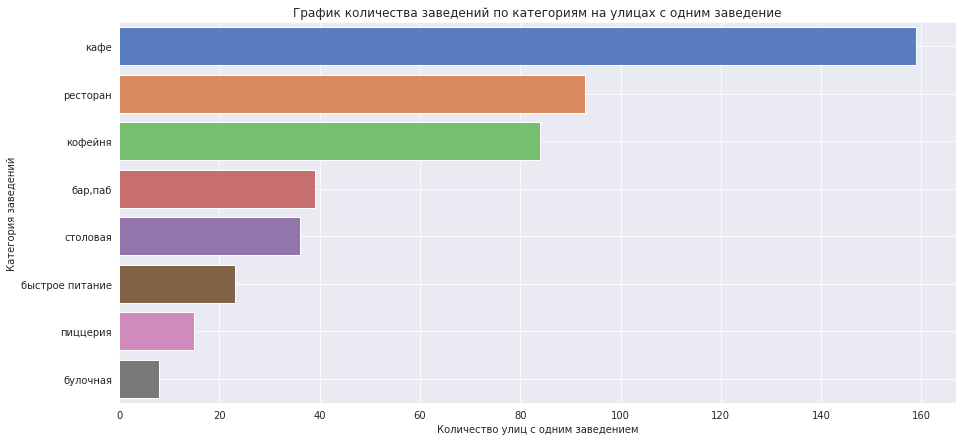

In [69]:
sns.set_style('dark') # выбираем стиль сетки
sns.set_palette('muted') # выбираем стиль палитры
plt.figure(figsize=(15, 7)) # назначаем размер графика

# строим столбчатый график средствами seaborn
sns.barplot(y=df_temp_1.index, x='name', data=df_temp_1, orient='h')

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('График количества заведений по категориям на улицах с одним заведение')
plt.xlabel('Количество улиц с одним заведением')
plt.ylabel('Категория заведений')

# plt.xticks(rotation=45) # поворачиваем подписи значений
# plt.yticks(rotation=45) # поворачиваем подписи значений

#plt.xlim(4, 5) # ограничиваем ось X для наглядности
# plt.ylim(0, 5000) # ограничиваем ось X для наглядности

#plt.legend() # легенда # plt.legend(loc='lower right', fontsize=10)
plt.grid() # добавляем сетку
plt.show() # отображаем график на экране

In [70]:
df_temp_1 = df_temp.pivot_table(index = 'district', values = 'name', aggfunc = 'count')
df_temp_1 = df_temp_1.sort_values(by='name', ascending = False)
df_temp_1

,name
district,
Центральный административный округ,145
Северо-Восточный административный округ,55
Восточный административный округ,52
Северный административный округ,51
Южный административный округ,43
Юго-Восточный административный округ,39
Западный административный округ,35
Северо-Западный административный округ,19
Юго-Западный административный округ,18


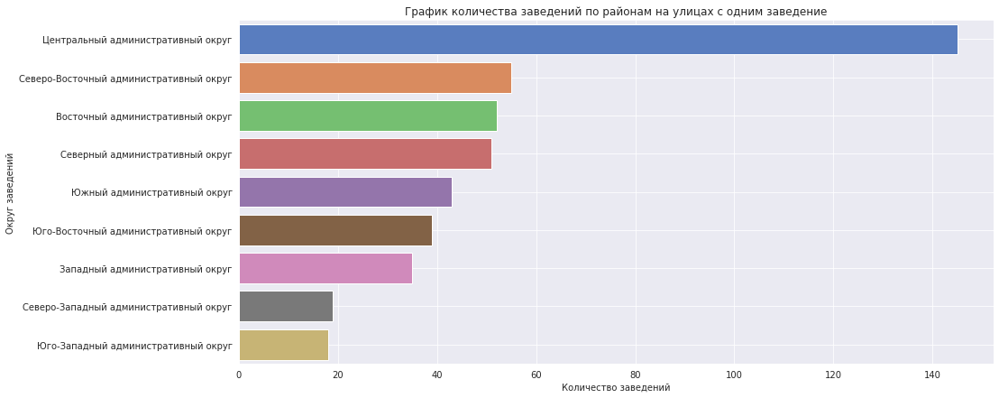

In [71]:
sns.set_style('dark') # выбираем стиль сетки
sns.set_palette('muted') # выбираем стиль палитры
plt.figure(figsize=(15, 7)) # назначаем размер графика

# строим столбчатый график средствами seaborn
sns.barplot(y=df_temp_1.index, x='name', data=df_temp_1, orient='h')

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('График количества заведений по районам на улицах с одним заведение')
plt.xlabel('Количество заведений')
plt.ylabel('Округ заведений')

# plt.xticks(rotation=45) # поворачиваем подписи значений
# plt.yticks(rotation=45) # поворачиваем подписи значений

#plt.xlim(4, 5) # ограничиваем ось X для наглядности
# plt.ylim(0, 5000) # ограничиваем ось X для наглядности

#plt.legend() # легенда # plt.legend(loc='lower right', fontsize=10)
plt.grid() # добавляем сетку
plt.show() # отображаем график на экране

No handles with labels found to put in legend.


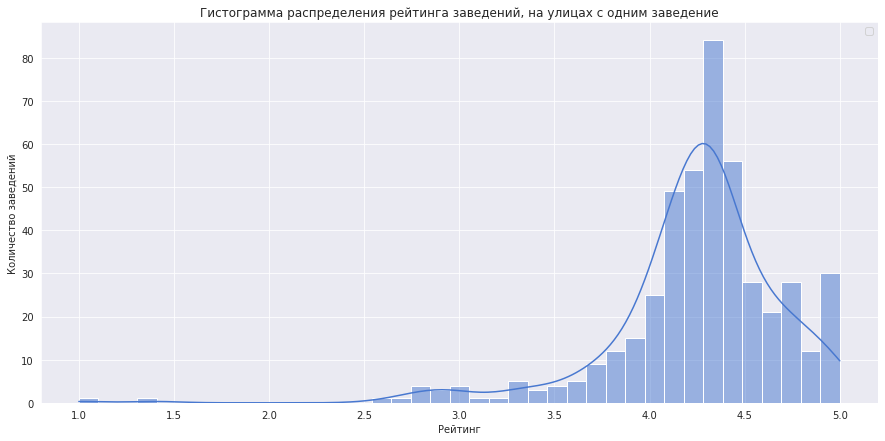

In [72]:
sns.set_style('dark') # выбираем стиль сетки
sns.set_palette('muted') # выбираем стиль палитры
plt.figure(figsize=(15, 7)) # назначаем размер графика

# строим столбчатый график средствами seaborn
sns.histplot(x='rating', data=df_temp, kde=True)

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Гистограмма распределения рейтинга заведений, на улицах с одним заведение')
plt.xlabel('Рейтинг')
plt.ylabel('Количество заведений')

# plt.xticks(rotation=45) # поворачиваем подписи значений
# plt.yticks(rotation=45) # поворачиваем подписи значений

#plt.xlim(0, 50) # ограничиваем ось X для наглядности
# plt.ylim(0, 5000) # ограничиваем ось X для наглядности

plt.legend() # легенда # plt.legend(loc='lower right', fontsize=10)
plt.grid() # добавляем сетку
plt.show() # отображаем график на экране

##### Вывод:
1. По типу заведений которые расположены на улицах, на которых находится только один объект общепита:
     - чаще всего бывают кафе, рестораны, кофейни.
     - Меньше всегод одни на улице бывают пиццерии и булочные.
2. По количеств улиц с одним заведением:
    - лидером является Центральный административный округ.	
    - аутсайдерами Северо-Западный административный округ, Юго-Западный административный округ	.

#### Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

In [73]:
df_temp = df.pivot_table(index = 'district', values = 'middle_avg_bill', aggfunc = 'median')
df_temp = df_temp.reset_index()
df_temp

rating_df = df.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
rating_df = rating_df.sort_values(by ='middle_avg_bill', ascending = False)
rating_df

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [74]:
# подключаем модуль для работы с JSON-форматом
import json

# читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)
    
#print(json.dumps(geo_json, indent=2, ensure_ascii=False, sort_keys=True))
    
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=df_temp,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

##### Вывод:
1. Самые высокие средние чеки (1000 ₽) – в Центральном (ЦАО) и Западном (ЗАО) округах
2. Самые низкие средние чеки (450–500 ₽) – в Юго-Восточном (ЮВАО) и Южном (ЮАО) округах, а также в Северо-Восточном (СВАО).

### Общий вывод:

По данным представленным в датасете на ряд вопросов получены ответы:

Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям:
1. Кафе (2378 шт), рестораны (2043 шт) и кофейни (1412 шт) самые распространённые типы заведений
2. В данных представлены так же бар,паб (765 шт), пиццерии (633 шт), заведения быстрого питания (603 шт), столовые (315 шт) и булочные(256 шт)

Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации:
Используя медиану(так как устойчива к выбросам) количества посадочных мест в каждой категории.
По графику и таблице, распределим заведения количеству посадочных мест:
1. Самые вместительные: рестораны, бары/пабы, кофейни. 
2. Средний уровень: столовые, рестораны быстрого питания, кафе.
3. Самые компактные заведения: пиццерии и булочные


Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?
1. Большее количество заведений не сетевые. Занимают долю 61,9 процентов (5201 Шт)
2. Сетевые заведения занимают долю 38,1 %

Какие категории заведений чаще являются сетевыми?
1. Булочные — лидер по доле сетевых заведений (61.3%)
2. Пиццерии и кофейни примерно одинаковое количество сетевых и несетевых заведений 
2. Кафе, рестораны и бары чаще являются несетевыми.


Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. К какой категории заведений они относятся?
1. Самые популярные франшизы: Шоколадница, домино с пицца, до-до пицца, one price coffee, яндекс лавка
2. Кофейни лидируют в топе сетевых заведений.
3. Кафе, рестораны и пиццерии занимают среднее положение в топе сетевых заведений.
4. Булочные и быстрое питание встречаются по 1 сети в топе сетевых заведений


Какие административные районы Москвы присутствуют в датасете? 
1. Лидер: Центральный административный округ (ЦАО) – 2241 заведение (почти в 2.5 раза больше, чем у ближайшего конкурента).
2. Аутсайдер: Северо-Западный административный округ (СЗАО) – всего 409 заведений (почти в 5.5 раз меньше, чем в ЦАО).
3. Остальные округи так сильно не отличаются от 709 до 900 заведений

Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?
1. Средний рейтинг заведений всех категорий более 4
2. Самый высокий средний рейтинг имеют заведения бар,паб.
3. Среднее место по среднему рейтингу занимают: пиццерия, ресторан, кофейня, булочная, столовая
4. Аутсайдерами по средниему рейтингу являются: кафе, быстрое питание


Найдите топ-15 улиц по количеству заведений.
1. Кафе лидирует на большенстве улицах
2. Так же в популярная категория заведений: рестораны и кафе.
3. Проспект Мира – лидер по количеству заведений
4. На МКАДе самые популярные заведения кафе (45 заведений из 65)

Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?
1. По типу заведений которые расположены на улицах, на которых находится только один объект общепита:
     - чаще всего бывают кафе, рестораны, кофейни.
     - Меньше всегод одни на улице бывают пиццерии и булочные.
2. По количеств улиц с одним заведением:
    - лидером является Центральный административный округ.	
    - аутсайдерами Северо-Западный административный округ, Юго-Западный административный округ	.

Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. 
1. Самые высокие средние чеки (1000 ₽) – в Центральном (ЦАО) и Западном (ЗАО) округах
2. Самые низкие средние чеки (450–500 ₽) – в Юго-Восточном (ЮВАО) и Южном (ЮАО) округах, а также в Северо-Восточном (СВАО).   

### Шаг 4. Детализируем исследование: открытие кофейни

In [75]:
df.head

<bound method NDFrame.head of                       name  category  \
0                   wowфли      кафе   
1           четыре комнаты  ресторан   
2                    хазри      кафе   
3     dormouse coffee shop   кофейня   
4                иль марко  пиццерия   
...                    ...       ...   
8401            суши мания      кафе   
8402             миславнес      кафе   
8403               самовар      кафе   
8404          чайхана sabr      кафе   
8405            kebab time      кафе   

                                         address  \
0                     москва, улица дыбенко, 7/1   
1             москва, улица дыбенко, 36, корп. 1   
2                 москва, клязьминская улица, 15   
3            москва, улица маршала федоренко, 12   
4                москва, правобережная улица, 1б   
...                                          ...   
8401               москва, профсоюзная улица, 56   
8402  москва, пролетарский проспект, 19, корп. 1   
8403      москва, люб

#### Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [76]:
df_2 = df.query('category == "кофейня"')
print('В данных кофеен:',len(df_2))

В данных кофеен: 1412


In [77]:
df_temp = df_2.pivot_table(index = 'district', values = 'name', aggfunc='count')
df_temp = df_temp.sort_values(by = 'name', ascending= False)
df_temp

,name
district,
Центральный административный округ,427
Северный административный округ,193
Северо-Восточный административный округ,159
Западный административный округ,150
Южный административный округ,131
Восточный административный округ,105
Юго-Западный административный округ,96
Юго-Восточный административный округ,89
Северо-Западный административный округ,62


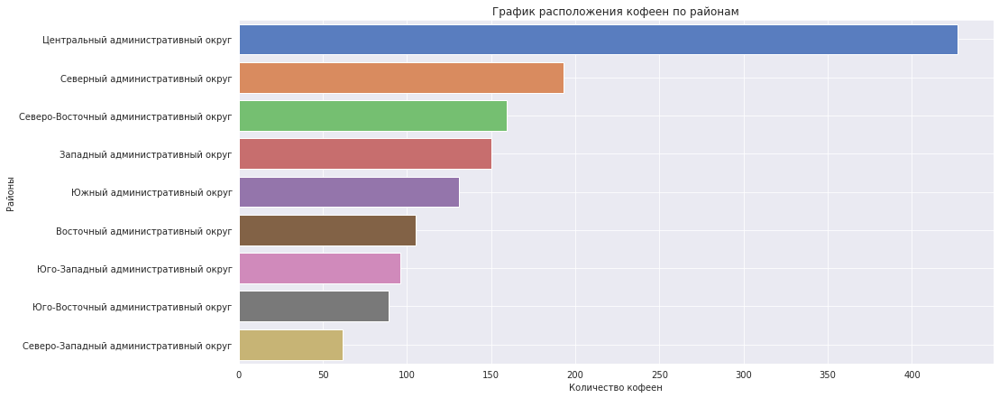

In [78]:
sns.set_style('dark') # выбираем стиль сетки
sns.set_palette('muted') # выбираем стиль палитры
plt.figure(figsize=(15, 7)) # назначаем размер графика

# строим график
sns.barplot(y=df_temp.index, x=df_temp['name'], orient='h')

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('График расположения кофеен по районам')
plt.xlabel('Количество кофеен')
plt.ylabel('Районы')

# plt.xticks(rotation=45) # поворачиваем подписи значений
# plt.yticks(rotation=45) # поворачиваем подписи значений

# plt.xlim(0, 600) # ограничиваем ось X для наглядности
# plt.ylim(0, 5000) # ограничиваем ось X для наглядности

#plt.legend() # легенда # plt.legend(loc='lower right', fontsize=10)
plt.grid() # добавляем сетку
plt.show() # отображаем график на экране

Вывод:
1. Абсолютный лидер – Центральный административный округ (ЦАО) с 427 кофейнями.
2. Наименьшее количество заведений – в Северо-Западном округе

#### Есть ли круглосуточные кофейни?

In [79]:
display('В данных круглосуточных кофеен:', len(df_2.query('total == True')))
display('В данных кофеен:', len(df_2))
display('Процент круглосуточных кофеен:', round(len(df_2.query('total == True')) / len(df_2) * 100, 1))

'В данных круглосуточных кофеен:'

58

'В данных кофеен:'

1412

'Процент круглосуточных кофеен:'

4.1

In [80]:
df_temp = df_2.pivot_table(index = 'district', values = 'name', columns = 'total', aggfunc='count')
df_temp = df_temp.sort_values(by = True, ascending = False)
df_temp 

total,False,True
district,,
Центральный административный округ,402,25
Западный административный округ,141,9
Юго-Западный административный округ,89,7
Восточный административный округ,100,5
Северный административный округ,188,5
Северо-Восточный административный округ,156,3
Северо-Западный административный округ,60,2
Юго-Восточный административный округ,88,1
Южный административный округ,130,1


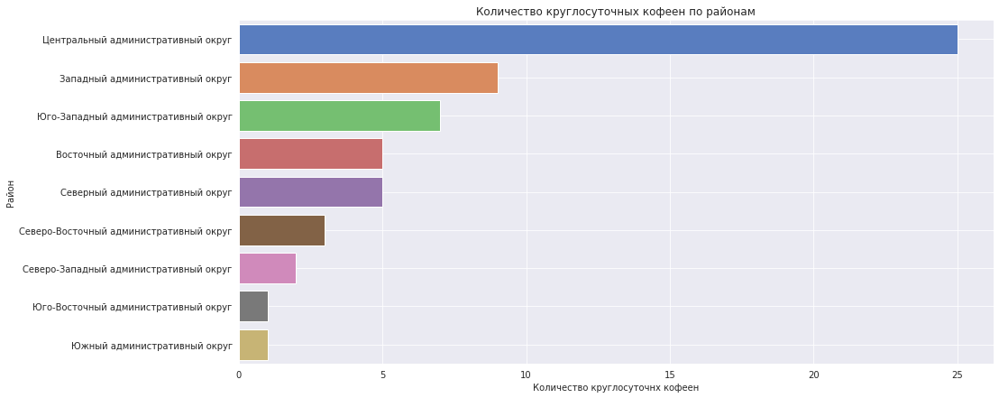

In [81]:
sns.set_style('dark') # выбираем стиль сетки
sns.set_palette('muted') # выбираем стиль палитры

plt.figure(figsize=(15, 7)) # назначаем размер графика

# строим столбчатый график средствами seaborn
sns.barplot(y=df_temp.index, x=df_temp[True], orient='h')

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Количество круглосуточных кофеен по районам')
plt.ylabel('Район')
plt.xlabel('Количество круглосуточнх кофеен')

# plt.xticks(rotation=45) # поворачиваем подписи значений
# plt.yticks(rotation=45) # поворачиваем подписи значений

# plt.xlim(0, 600) # ограничиваем ось X для наглядности
# plt.ylim(0, 5000) # ограничиваем ось X для наглядности

#plt.legend() # легенда # plt.legend(loc='lower right', fontsize=10)
plt.grid() # добавляем сетку
plt.show() # отображаем график на экране

In [82]:
df_temp['ratio'] = round(df_temp[True]/(df_temp[True]+df_temp[False])*100,1)
df_temp = df_temp.sort_values(by = 'ratio', ascending = False)
df_temp

total,False,True,ratio
district,,,
Юго-Западный административный округ,89,7,7.3
Западный административный округ,141,9,6.0
Центральный административный округ,402,25,5.9
Восточный административный округ,100,5,4.8
Северо-Западный административный округ,60,2,3.2
Северный административный округ,188,5,2.6
Северо-Восточный административный округ,156,3,1.9
Юго-Восточный административный округ,88,1,1.1
Южный административный округ,130,1,0.8


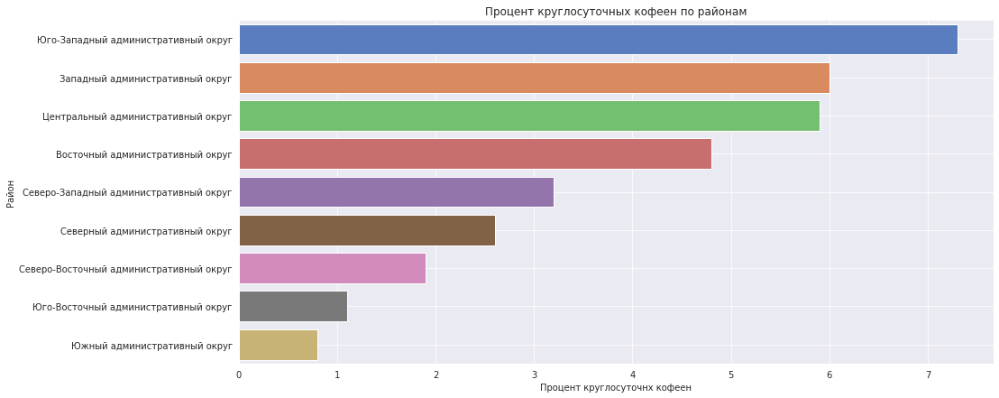

In [83]:
sns.set_style('dark') # выбираем стиль сетки
sns.set_palette('muted') # выбираем стиль палитры

plt.figure(figsize=(15, 7)) # назначаем размер графика

# строим столбчатый график средствами seaborn
sns.barplot(y=df_temp.index, x=df_temp['ratio'], orient='h')

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Процент круглосуточных кофеен по районам')
plt.ylabel('Район')
plt.xlabel('Процент круглосуточнх кофеен')

# plt.xticks(rotation=45) # поворачиваем подписи значений
# plt.yticks(rotation=45) # поворачиваем подписи значений

# plt.xlim(0, 600) # ограничиваем ось X для наглядности
# plt.ylim(0, 5000) # ограничиваем ось X для наглядности

#plt.legend() # легенда # plt.legend(loc='lower right', fontsize=10)
plt.grid() # добавляем сетку
plt.show() # отображаем график на экране

##### Вывод:
1. Круглосуточные кофейни редки всего 4,1 %
2. Абсолютный лидер – Центральный административный округ (ЦАО): 25 круглосуточных заведений
3. Средние значения (от 2-9 заведений) – в ЗАО, ЮЗАО, ВАО, САО, СЗАО
4. Наименьшее количество – ЮАО и ЮВАО
5. В процентном соотношении лидеры: 
    - Юго-Западный административный округ, 
	- Западный административный округ,
	- Центральный административный округ
6. Аутсайдеры по процентном соотношении круглосуточных кофеен: 
	- Южный административный округ
    - Юго-Восточный административный округ
    - Северо-Восточный административный округ
7. Разброс относительных значений значительный: от 0,8% до 7,3%, что может указывать на существенные различия между округами.

#### Какие у кофеен рейтинги? Как они распределяются по районам?

In [84]:
df_temp = df_2.pivot_table(index = 'district', values = 'rating', aggfunc='mean')
df_temp = df_temp.sort_values(by = 'rating', ascending = False)
df_temp 

,rating
district,
Центральный административный округ,4.336066
Северо-Западный административный округ,4.325806
Северный административный округ,4.291710
Юго-Западный административный округ,4.283333
Восточный административный округ,4.282857
Южный административный округ,4.232824
Юго-Восточный административный округ,4.225843
Северо-Восточный административный округ,4.216981
Западный административный округ,4.195333


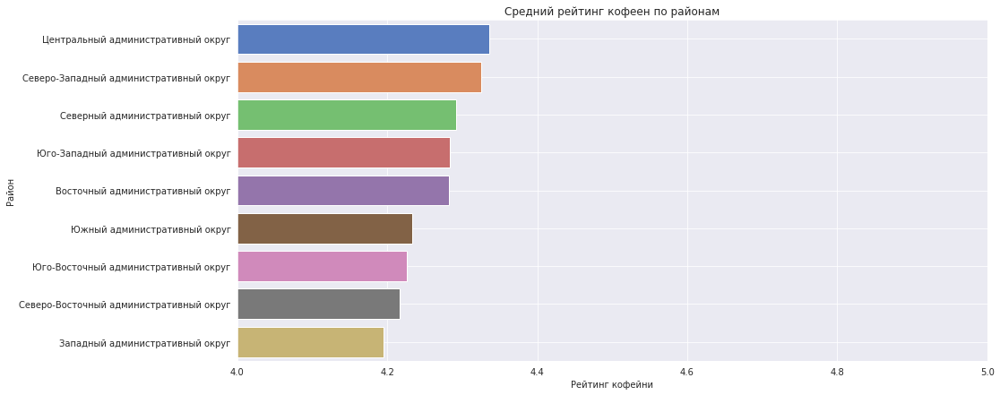

In [85]:
sns.set_style('dark') # выбираем стиль сетки
sns.set_palette('muted') # выбираем стиль палитры

plt.figure(figsize=(15, 7)) # назначаем размер графика

# строим столбчатый график средствами seaborn
sns.barplot(y=df_temp.index, x=df_temp['rating'], orient='h')

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Средний рейтинг кофеен по районам')
plt.ylabel('Район')
plt.xlabel('Рейтинг кофейни')

# plt.xticks(rotation=45) # поворачиваем подписи значений
# plt.yticks(rotation=45) # поворачиваем подписи значений

plt.xlim(4, 5) # ограничиваем ось X для наглядности
# plt.ylim(0, 5000) # ограничиваем ось X для наглядности

#plt.legend() # легенда # plt.legend(loc='lower right', fontsize=10)
plt.grid() # добавляем сетку
plt.show() # отображаем график на экране

##### Вывод:
1. Лидеры:
 - Центральный административный округ
 - Северо-Западный административный округ
 
2. Аутсайдеры:
 - Северо-Восточный административный округ	
 - Западный административный округ

#### На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [86]:
df_2['middle_coffee_cup'].describe()

count    521.000000
mean     172.545106
std       65.816633
min       60.000000
25%      124.000000
50%      170.000000
75%      225.000000
max      375.000000
Name: middle_coffee_cup, dtype: float64

In [87]:
df_2['middle_coffee_cup'].value_counts().head(10)

256.0    43
60.0     33
95.0     32
150.0    22
200.0    18
170.0    17
225.0    15
135.0    14
180.0    13
250.0    13
Name: middle_coffee_cup, dtype: int64

No handles with labels found to put in legend.


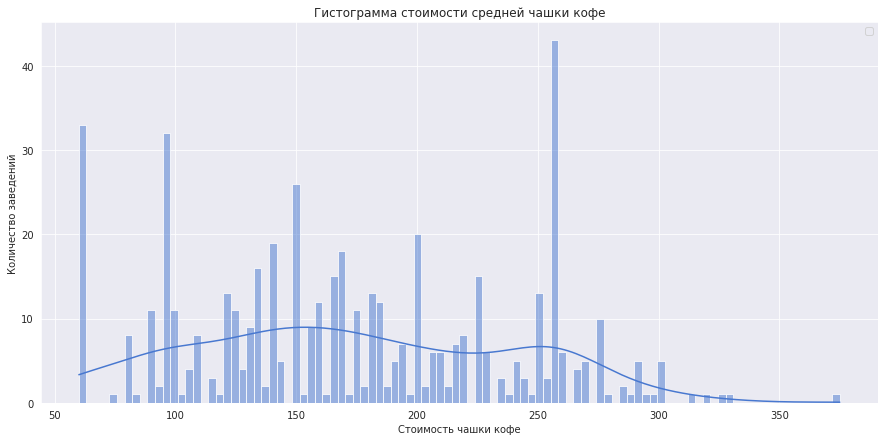

In [88]:
sns.set_style('dark') # выбираем стиль сетки
sns.set_palette('muted') # выбираем стиль палитры
plt.figure(figsize=(15, 7)) # назначаем размер графика

# строим столбчатый график средствами seaborn
sns.histplot(x='middle_coffee_cup', data=df_2, kde=True, bins=100)

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Гистограмма стоимости средней чашки кофе')
plt.xlabel('Стоимость чашки кофе')
plt.ylabel('Количество заведений')

# plt.xticks(rotation=45) # поворачиваем подписи значений
# plt.yticks(rotation=45) # поворачиваем подписи значений

#№plt.xlim(0, 50) # ограничиваем ось X для наглядности
# plt.ylim(0, 5000) # ограничиваем ось X для наглядности

plt.legend() # легенда # plt.legend(loc='lower right', fontsize=10)
plt.grid() # добавляем сетку
plt.show() # отображаем график на экране

No handles with labels found to put in legend.


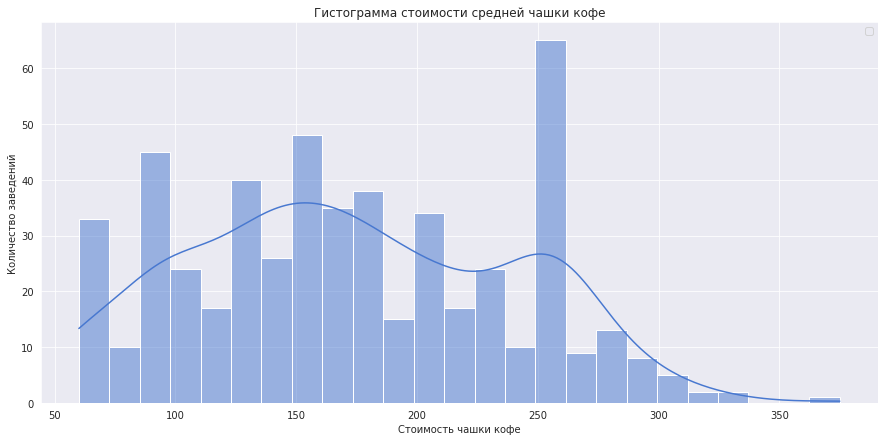

In [89]:
sns.set_style('dark') # выбираем стиль сетки
sns.set_palette('muted') # выбираем стиль палитры
plt.figure(figsize=(15, 7)) # назначаем размер графика

# строим столбчатый график средствами seaborn
sns.histplot(x='middle_coffee_cup', data=df_2, kde=True, bins=25)

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Гистограмма стоимости средней чашки кофе')
plt.xlabel('Стоимость чашки кофе')
plt.ylabel('Количество заведений')

# plt.xticks(rotation=45) # поворачиваем подписи значений
# plt.yticks(rotation=45) # поворачиваем подписи значений

#№plt.xlim(0, 50) # ограничиваем ось X для наглядности
# plt.ylim(0, 5000) # ограничиваем ось X для наглядности

plt.legend() # легенда # plt.legend(loc='lower right', fontsize=10)
plt.grid() # добавляем сетку
plt.show() # отображаем график на экране

No handles with labels found to put in legend.


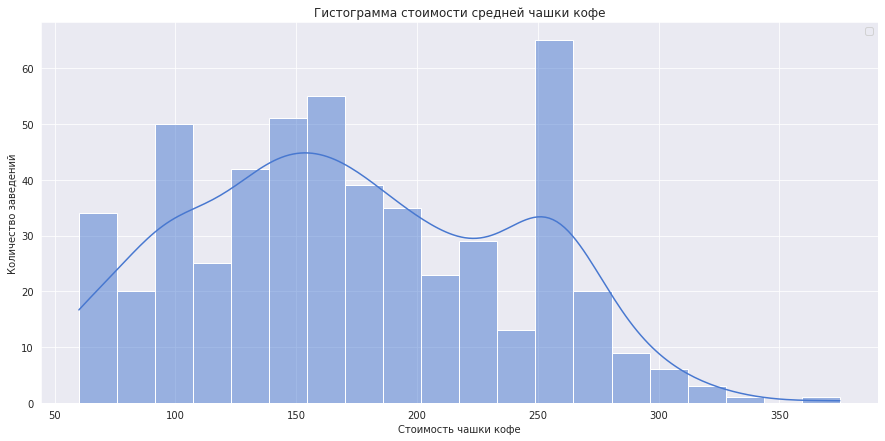

In [90]:
sns.set_style('dark') # выбираем стиль сетки
sns.set_palette('muted') # выбираем стиль палитры
plt.figure(figsize=(15, 7)) # назначаем размер графика

# строим столбчатый график средствами seaborn
sns.histplot(x='middle_coffee_cup', data=df_2, kde=True, bins=20)

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Гистограмма стоимости средней чашки кофе')
plt.xlabel('Стоимость чашки кофе')
plt.ylabel('Количество заведений')

# plt.xticks(rotation=45) # поворачиваем подписи значений
# plt.yticks(rotation=45) # поворачиваем подписи значений

#№plt.xlim(0, 50) # ограничиваем ось X для наглядности
# plt.ylim(0, 5000) # ограничиваем ось X для наглядности

plt.legend() # легенда # plt.legend(loc='lower right', fontsize=10)
plt.grid() # добавляем сетку
plt.show() # отображаем график на экране

##### Выводы:
1. Минимальная стоимость чашки кофе 60, максимальная 375.
2. Медианная стоимость чашки кофе 170 
3. Большинсто кофеен установили разброс цен на чашку кофе от 124 до 225.
4. На графике видны пики около стоимости около 250, 150, и 100 рублей за чашку


#### Попробуйте дать рекомендацию для открытия нового заведения.

In [91]:
#df_2.head(2)

Посмотрим улицы Москвы с наибольшим количеством кофеен и выделим в них:
1. количество кофеен на улице
2. количество сетевых кофеен
3. количество круглосуточных кофеен
4. количество и названия районов в которых располагается улица
5. для средних чашек кофе найдем:
    - минимум.
    - 25, 75 перцентили
    - медиану.
    - максимальное значение
6. медиану количество мест
7. средний рейтинг и медиану    

In [92]:
df_temp = (
            df_2
            #.query('district == "Центральный административный округ"')
            .groupby(['street'])
            .agg({'name': ['count'], 
                  
                  'chain' : ['sum'],
                  'total' : ['sum'],
                  'district' : ['nunique', 'unique'],  
                  
                  'middle_coffee_cup' : ['count','min', lambda x: x.quantile(0.25), 'median',lambda x: x.quantile(0.75), 'max'],
                                   
                  'seats' : ['median'],
                  'rating': ['mean', 'median'],
                            
                  })
            #.rename(columns={'<lambda>': 'percentile_75'})
        )
df_temp = df_temp.sort_values(by = (  'name', 'count'), ascending = False)
df_temp = df_temp.head(10)
df_temp
#df_temp.columns

name chain total district  \
                       count   sum   sum  nunique   
street                                              
проспект мира             36    21     0        2   
ленинградский проспект    25    11     2        1   
ленинский проспект        23     8     3        4   
профсоюзная улица         18    12     1        1   
проспект вернадского      16    11     1        1   
каширское шоссе           16    11     0        1   
варшавское шоссе          14     7     0        1   
ленинградское шоссе       13    11     0        1   
новослободская улица      13     7     0        1   
кутузовский проспект      13    10     3        1   

                                                                           \
                                                                   unique   
street                                                                      
проспект мира           [Северо-Восточный административный округ, Цент...   
ленинградский проспект                  [Северный административный округ]   
ленинский проспект      [Центральный административный округ, Юго-Запад...   
профсоюзная улица                   [Юго-Западный административный округ]   
проспект вернадского                    [Западный административный округ]   
каширское шоссе                            [Южный административный округ]   
варшавское шоссе                           [Южный административный округ]   
ленинградское шоссе                     [Северный административный округ]   
новослободская улица                 [Центральный административный округ]   
кутузовский проспект                    [Западный административный округ]   

                       middle_coffee_cup                                      \
                                   count    min <lambda_0> median <lambda_1>   
street                                                                         
проспект мира                          9   60.0     169.00  220.0     230.00   
ленинградский проспект                11  105.0     157.00  180.0     229.50   
ленинский проспект                     9  160.0     205.00  227.0     250.00   
профсоюзная улица                      6   95.0     105.00  150.0     210.00   
проспект вернадского                   4   60.0     116.25  197.5     270.00   
каширское шоссе                        5   60.0      95.00  140.0     149.00   
варшавское шоссе                       4   95.0     147.50  185.0     217.75   
ленинградское шоссе                    2   95.0     145.00  195.0     245.00   
новослободская улица                   4   95.0     113.75  127.5     150.00   
кутузовский проспект                   6   60.0     133.75  253.0     266.50   

                               seats    rating         
                          max median      mean median  
street                                                 
проспект мира           256.0  111.5  4.141667   4.20  
ленинградский проспект  285.0  150.0  4.336000   4.30  
ленинский проспект      266.0   98.0  4.386957   4.40  
профсоюзная улица       256.0   80.5  4.250000   4.30  
проспект вернадского    300.0  160.0  4.131250   4.20  
каширское шоссе         210.0  176.0  4.306250   4.25  
варшавское шоссе        256.0  180.0  4.292857   4.25  
ленинградское шоссе     295.0   96.0  4.176923   4.10  
новослободская улица    195.0  217.0  4.323077   4.30  
кутузовский проспект    275.0   96.0  4.300000   4.30

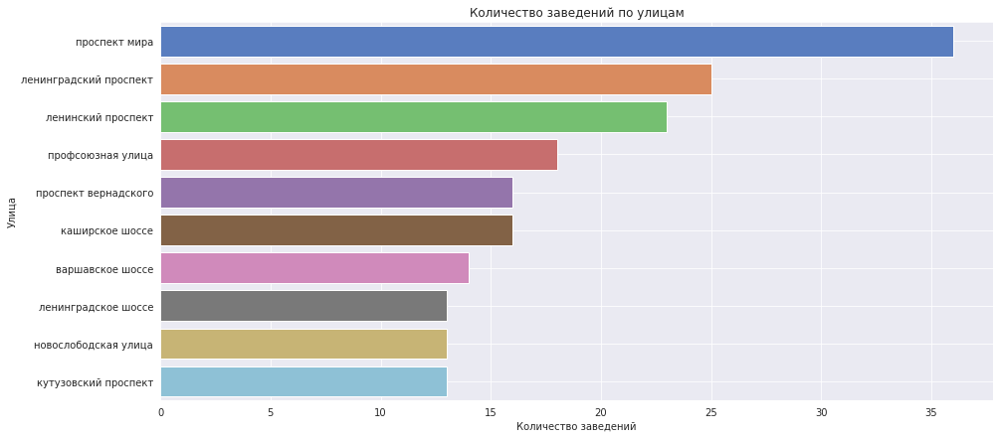

In [93]:
sns.set_style('dark') # выбираем стиль сетки
sns.set_palette('muted') # выбираем стиль палитры

plt.figure(figsize=(15, 7)) # назначаем размер графика

# строим столбчатый график средствами seaborn
sns.barplot(y=df_temp.index, x=df_temp[('name','count')], orient='h')

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Количество заведений по улицам')
plt.ylabel('Улица')
plt.xlabel('Количество заведений')

# plt.xticks(rotation=45) # поворачиваем подписи значений
# plt.yticks(rotation=45) # поворачиваем подписи значений

# plt.xlim(0, 600) # ограничиваем ось X для наглядности
# plt.ylim(0, 5000) # ограничиваем ось X для наглядности

#plt.legend() # легенда # plt.legend(loc='lower right', fontsize=10)
plt.grid() # добавляем сетку
plt.show() # отображаем график на экране

##### Выводы
1. Наибольшее количество кофеен находится на проспекте Мира (36 заведений), за ним следуют Ленинградский проспект (25) и Ленинский проспект (23).

In [94]:
df_2.query('street == "ленинский проспект"')['district'].unique()

array(['Центральный административный округ',
       'Юго-Западный административный округ',
       'Южный административный округ', 'Западный административный округ'],
      dtype=object)

##### Интересное наблюдение
1. Некоторые улицы входят в несколько округов
    - Например Ленинский проспект входит в округи: 
        - Центральный административный округ,
        - 'Юго-Западный административный округ',
        - 'Южный административный округ', 
        - 'Западный административный округ' 
    - Эти улицы протяженные. Если рассматривать размещение заведения на таких улицах, то нужно внимательнее смотреть на район размещения заведений. 

In [95]:
#df_2.query('street == "ленинский проспект"')

In [96]:
# Добавить разброс усов по чашкам кофе
df_3 = df_2.query('street in @df_temp.index')

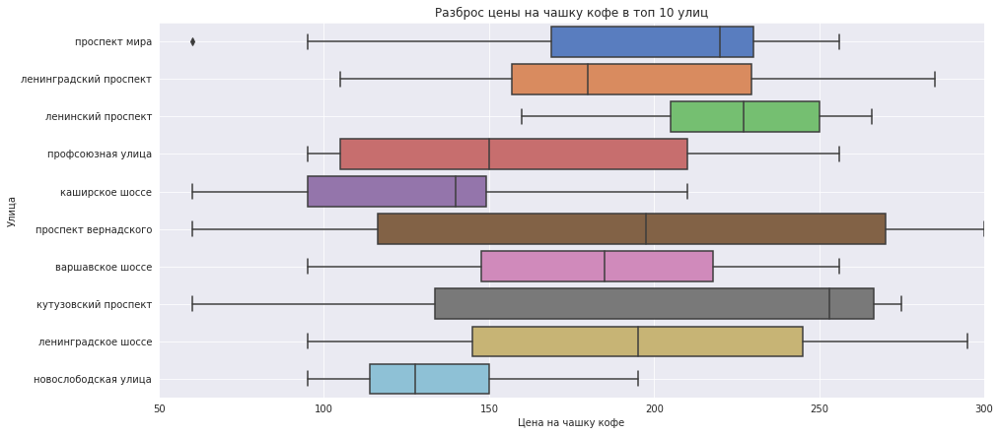

In [97]:
sns.set_style('dark') # выбираем стиль сетки
sns.set_palette('muted') # выбираем стиль палитры
plt.figure(figsize=(15, 7)) # назначаем размер графика

median_order = df_3.groupby('street')['name'].count().sort_values(ascending = False).index.tolist()
# строим столбчатый график средствами seaborn
sns.boxplot(y='street', x='middle_coffee_cup', data=df_3, orient = 'h', order=median_order)

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Разброс цены на чашку кофе в топ 10 улиц')
plt.xlabel('Цена на чашку кофе')
plt.ylabel('Улица')

# plt.xticks(rotation=45) # поворачиваем подписи значений
# plt.yticks(rotation=45) # поворачиваем подписи значений

plt.xlim(50, 300) # ограничиваем ось X для наглядности
#plt.ylim(0, 400) # ограничиваем ось X для наглядности

#plt.legend() # легенда # plt.legend(loc='lower right', fontsize=10)
plt.grid() # добавляем сетку
plt.show() # отображаем график на экране

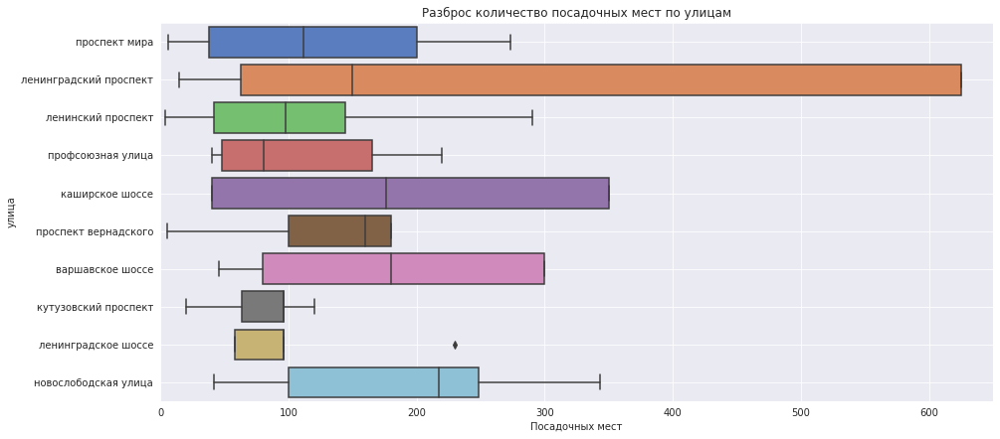

In [98]:
sns.set_style('dark') # выбираем стиль сетки
sns.set_palette('muted') # выбираем стиль палитры
plt.figure(figsize=(15, 7)) # назначаем размер графика

median_order = df_3.groupby('street')['name'].count().sort_values(ascending = False).index.tolist()
# строим столбчатый график средствами seaborn
sns.boxplot(y='street', x='seats', data=df_3, orient = 'h', order=median_order)

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Разброс количество посадочных мест по улицам')
plt.xlabel('Посадочных мест')
plt.ylabel('улица')

# plt.xticks(rotation=45) # поворачиваем подписи значений
# plt.yticks(rotation=45) # поворачиваем подписи значений

plt.xlim(0, 650) # ограничиваем ось X для наглядности
#plt.ylim(0, 400) # ограничиваем ось X для наглядности

#plt.legend() # легенда # plt.legend(loc='lower right', fontsize=10)
plt.grid() # добавляем сетку
plt.show() # отображаем график на экране

In [99]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']}",# {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df_3.apply(create_clusters, axis=1)

# выводим карту
m

Для выбора места расположения кафе выберем район ЦАО, как самый конкурентный и самый дорогой район.
Посмотрим улицы района ЦАО с наибольшим количеством кофеен и выделим в них:
1. количество кофеен на улице
2. количество сетевых кофеен
3. количество круглосуточных кофеен
4. количество и названия районов в которых располагается улица
5. для средних чашек кофе найдем:
    - минимум.
    - 25, 75 перцентили
    - медиану.
    - максимальное значение
6. медиану количество мест
7. средний рейтинг и медиану    

In [100]:
df_2.head(2)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,total
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк левобережный,False


In [101]:
df_temp_2 = (
            df_2
            .query('district == "Центральный административный округ"')
            .groupby(['street'])
            .agg({'name': ['count'], 
                  
                  'chain' : ['sum'],
                  'total' : ['sum'],
                  'district' : ['nunique', 'unique'],  
                  
                  'middle_coffee_cup' : ['count','min', lambda x: x.quantile(0.25), 'median',lambda x: x.quantile(0.75), 'max'],
                                   
                  'seats' : ['median'],
                  'rating': ['mean', 'median'],
                            
                  })
            #.rename(columns={'<lambda>': 'percentile_75'})
        )
df_temp_2 = df_temp_2.sort_values(by = (  'name', 'count'), ascending = False)
df_temp_2 = df_temp_2.head(10)
df_temp_2
#df_temp.columns

name chain total district  \
                             count   sum   sum  nunique   
street                                                    
проспект мира                   17    10     0        1   
новослободская улица            13     7     0        1   
верхняя красносельская улица     7     4     0        1   
улица земляной вал               7     3     1        1   
усачёва улица                    7     4     0        1   
садовническая улица              6     2     0        1   
пресненская набережная           6     4     0        1   
нижний сусальный переулок        6     6     0        1   
пятницкая улица                  6     3     0        1   
комсомольский проспект           6     4     1        1   

                                                                    \
                                                            unique   
street                                                               
проспект мира                 [Центральный административный округ]   
новослободская улица          [Центральный административный округ]   
верхняя красносельская улица  [Центральный административный округ]   
улица земляной вал            [Центральный административный округ]   
усачёва улица                 [Центральный административный округ]   
садовническая улица           [Центральный административный округ]   
пресненская набережная        [Центральный административный округ]   
нижний сусальный переулок     [Центральный административный округ]   
пятницкая улица               [Центральный административный округ]   
комсомольский проспект        [Центральный административный округ]   

                             middle_coffee_cup                           \
                                         count    min <lambda_0> median   
street                                                                    
проспект мира                                4  169.0     207.25  225.0   
новослободская улица                         4   95.0     113.75  127.5   
верхняя красносельская улица                 3  120.0     165.00  210.0   
улица земляной вал                           4  135.0     150.00  177.5   
усачёва улица                                5   60.0      95.00  210.0   
садовническая улица                          2  184.0     202.75  221.5   
пресненская набережная                       0    NaN        NaN    NaN   
нижний сусальный переулок                    3   60.0      99.50  139.0   
пятницкая улица                              1  225.0     225.00  225.0   
комсомольский проспект                       2  180.0     199.00  218.0   

                                                seats    rating         
                             <lambda_1>    max median      mean median  
street                                                                  
проспект мира                    236.50  256.0   60.0  4.335294   4.30  
новослободская улица             150.00  195.0  217.0  4.323077   4.30  
верхняя красносельская улица     230.00  250.0  160.0  4.342857   4.40  
улица земляной вал               206.25  225.0   85.0  4.400000   4.30  
усачёва улица                    214.00  225.0  100.0  4.300000   4.20  
садовническая улица              240.25  259.0  214.0  4.366667   4.40  
пресненская набережная              NaN    NaN  300.0  4.283333   4.35  
нижний сусальный переулок        139.50  140.0   80.0  4.200000   4.15  
пятницкая улица                  225.00  225.0  280.0  4.433333   4.35  
комсомольский проспект           237.00  256.0  121.0  4.166667   4.25

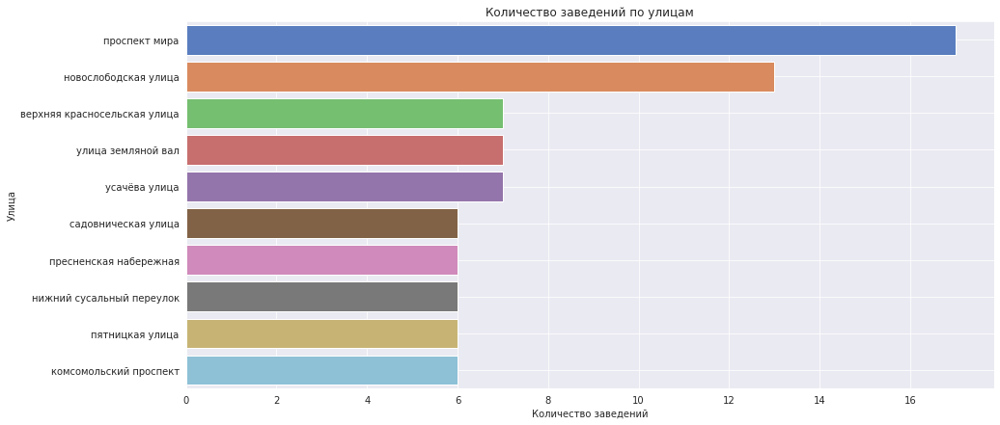

In [102]:
sns.set_style('dark') # выбираем стиль сетки
sns.set_palette('muted') # выбираем стиль палитры

plt.figure(figsize=(15, 7)) # назначаем размер графика

# строим столбчатый график средствами seaborn
sns.barplot(y=df_temp_2.index, x=df_temp_2[('name','count')], orient='h')

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Количество заведений по улицам')
plt.ylabel('Улица')
plt.xlabel('Количество заведений')

# plt.xticks(rotation=45) # поворачиваем подписи значений
# plt.yticks(rotation=45) # поворачиваем подписи значений

# plt.xlim(0, 600) # ограничиваем ось X для наглядности
# plt.ylim(0, 5000) # ограничиваем ось X для наглядности

#plt.legend() # легенда # plt.legend(loc='lower right', fontsize=10)
plt.grid() # добавляем сетку
plt.show() # отображаем график на экране

##### Выводы
1. Проспект Мира лидирует по числу заведений (17), за ним следуют Новослободская улица (13)

In [103]:
df_4 = df_2.query('street in @df_temp_2.index & district == "Центральный административный округ"')

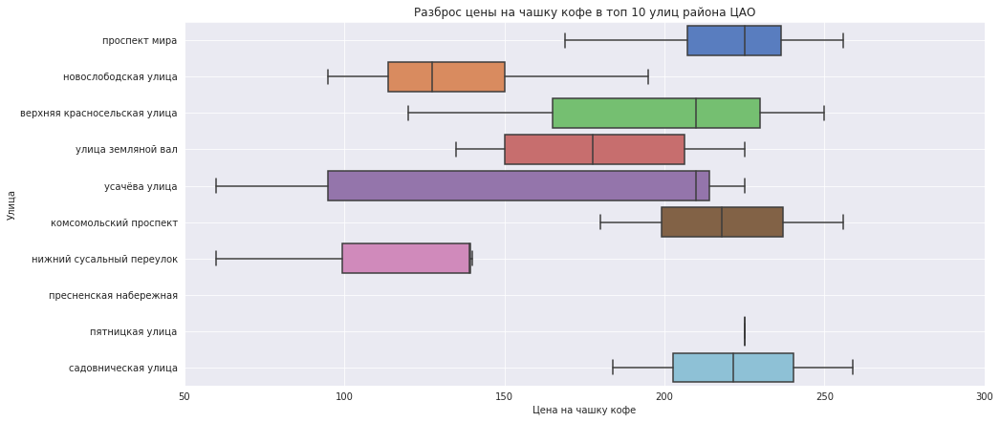

In [104]:
sns.set_style('dark') # выбираем стиль сетки
sns.set_palette('muted') # выбираем стиль палитры
plt.figure(figsize=(15, 7)) # назначаем размер графика

median_order = df_4.groupby('street')['name'].count().sort_values(ascending = False).index.tolist()
# строим столбчатый график средствами seaborn
sns.boxplot(y='street', x='middle_coffee_cup', data=df_4, orient = 'h', order=median_order)

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Разброс цены на чашку кофе в топ 10 улиц района ЦАО')
plt.xlabel('Цена на чашку кофе')
plt.ylabel('Улица')

# plt.xticks(rotation=45) # поворачиваем подписи значений
# plt.yticks(rotation=45) # поворачиваем подписи значений

plt.xlim(50, 300) # ограничиваем ось X для наглядности
#plt.ylim(0, 400) # ограничиваем ось X для наглядности

#plt.legend() # легенда # plt.legend(loc='lower right', fontsize=10)
plt.grid() # добавляем сетку
plt.show() # отображаем график на экране

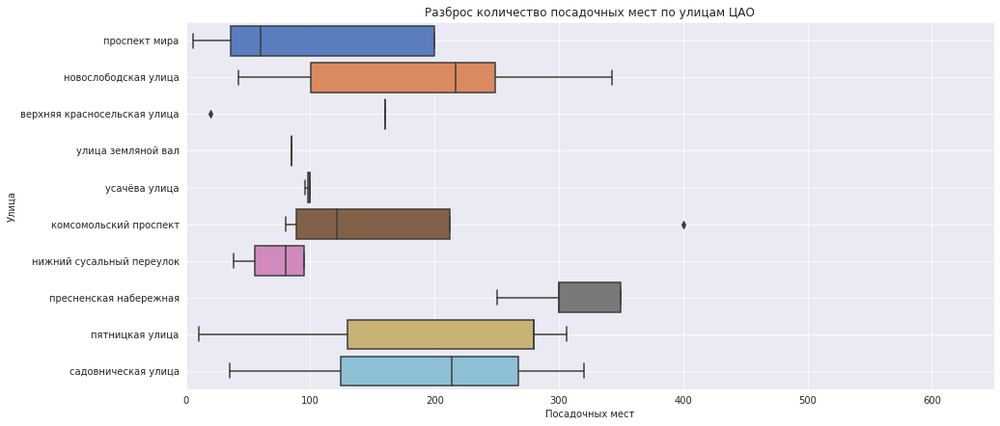

In [105]:
sns.set_style('dark') # выбираем стиль сетки
sns.set_palette('muted') # выбираем стиль палитры
plt.figure(figsize=(15, 7)) # назначаем размер графика

median_order = df_4.groupby('street')['name'].count().sort_values(ascending = False).index.tolist()
# строим столбчатый график средствами seaborn
sns.boxplot(y='street', x='seats', data=df_4, orient = 'h', order=median_order)

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Разброс количество посадочных мест по улицам ЦАО')
plt.xlabel('Посадочных мест')
plt.ylabel('Улица')

# plt.xticks(rotation=45) # поворачиваем подписи значений
# plt.yticks(rotation=45) # поворачиваем подписи значений

plt.xlim(0, 650) # ограничиваем ось X для наглядности
#plt.ylim(0, 400) # ограничиваем ось X для наглядности

#plt.legend() # легенда # plt.legend(loc='lower right', fontsize=10)
plt.grid() # добавляем сетку
plt.show() # отображаем график на экране

In [106]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']}",# {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df_4.apply(create_clusters, axis=1)

# выводим карту
m

In [107]:
df_temp

name chain total district  \
                       count   sum   sum  nunique   
street                                              
проспект мира             36    21     0        2   
ленинградский проспект    25    11     2        1   
ленинский проспект        23     8     3        4   
профсоюзная улица         18    12     1        1   
проспект вернадского      16    11     1        1   
каширское шоссе           16    11     0        1   
варшавское шоссе          14     7     0        1   
ленинградское шоссе       13    11     0        1   
новослободская улица      13     7     0        1   
кутузовский проспект      13    10     3        1   

                                                                           \
                                                                   unique   
street                                                                      
проспект мира           [Северо-Восточный административный округ, Цент...   
ленинградский проспект                  [Северный административный округ]   
ленинский проспект      [Центральный административный округ, Юго-Запад...   
профсоюзная улица                   [Юго-Западный административный округ]   
проспект вернадского                    [Западный административный округ]   
каширское шоссе                            [Южный административный округ]   
варшавское шоссе                           [Южный административный округ]   
ленинградское шоссе                     [Северный административный округ]   
новослободская улица                 [Центральный административный округ]   
кутузовский проспект                    [Западный административный округ]   

                       middle_coffee_cup                                      \
                                   count    min <lambda_0> median <lambda_1>   
street                                                                         
проспект мира                          9   60.0     169.00  220.0     230.00   
ленинградский проспект                11  105.0     157.00  180.0     229.50   
ленинский проспект                     9  160.0     205.00  227.0     250.00   
профсоюзная улица                      6   95.0     105.00  150.0     210.00   
проспект вернадского                   4   60.0     116.25  197.5     270.00   
каширское шоссе                        5   60.0      95.00  140.0     149.00   
варшавское шоссе                       4   95.0     147.50  185.0     217.75   
ленинградское шоссе                    2   95.0     145.00  195.0     245.00   
новослободская улица                   4   95.0     113.75  127.5     150.00   
кутузовский проспект                   6   60.0     133.75  253.0     266.50   

                               seats    rating         
                          max median      mean median  
street                                                 
проспект мира           256.0  111.5  4.141667   4.20  
ленинградский проспект  285.0  150.0  4.336000   4.30  
ленинский проспект      266.0   98.0  4.386957   4.40  
профсоюзная улица       256.0   80.5  4.250000   4.30  
проспект вернадского    300.0  160.0  4.131250   4.20  
каширское шоссе         210.0  176.0  4.306250   4.25  
варшавское шоссе        256.0  180.0  4.292857   4.25  
ленинградское шоссе     295.0   96.0  4.176923   4.10  
новослободская улица    195.0  217.0  4.323077   4.30  
кутузовский проспект    275.0   96.0  4.300000   4.30

In [108]:
df_temp_2

name chain total district  \
                             count   sum   sum  nunique   
street                                                    
проспект мира                   17    10     0        1   
новослободская улица            13     7     0        1   
верхняя красносельская улица     7     4     0        1   
улица земляной вал               7     3     1        1   
усачёва улица                    7     4     0        1   
садовническая улица              6     2     0        1   
пресненская набережная           6     4     0        1   
нижний сусальный переулок        6     6     0        1   
пятницкая улица                  6     3     0        1   
комсомольский проспект           6     4     1        1   

                                                                    \
                                                            unique   
street                                                               
проспект мира                 [Центральный административный округ]   
новослободская улица          [Центральный административный округ]   
верхняя красносельская улица  [Центральный административный округ]   
улица земляной вал            [Центральный административный округ]   
усачёва улица                 [Центральный административный округ]   
садовническая улица           [Центральный административный округ]   
пресненская набережная        [Центральный административный округ]   
нижний сусальный переулок     [Центральный административный округ]   
пятницкая улица               [Центральный административный округ]   
комсомольский проспект        [Центральный административный округ]   

                             middle_coffee_cup                           \
                                         count    min <lambda_0> median   
street                                                                    
проспект мира                                4  169.0     207.25  225.0   
новослободская улица                         4   95.0     113.75  127.5   
верхняя красносельская улица                 3  120.0     165.00  210.0   
улица земляной вал                           4  135.0     150.00  177.5   
усачёва улица                                5   60.0      95.00  210.0   
садовническая улица                          2  184.0     202.75  221.5   
пресненская набережная                       0    NaN        NaN    NaN   
нижний сусальный переулок                    3   60.0      99.50  139.0   
пятницкая улица                              1  225.0     225.00  225.0   
комсомольский проспект                       2  180.0     199.00  218.0   

                                                seats    rating         
                             <lambda_1>    max median      mean median  
street                                                                  
проспект мира                    236.50  256.0   60.0  4.335294   4.30  
новослободская улица             150.00  195.0  217.0  4.323077   4.30  
верхняя красносельская улица     230.00  250.0  160.0  4.342857   4.40  
улица земляной вал               206.25  225.0   85.0  4.400000   4.30  
усачёва улица                    214.00  225.0  100.0  4.300000   4.20  
садовническая улица              240.25  259.0  214.0  4.366667   4.40  
пресненская набережная              NaN    NaN  300.0  4.283333   4.35  
нижний сусальный переулок        139.50  140.0   80.0  4.200000   4.15  
пятницкая улица                  225.00  225.0  280.0  4.433333   4.35  
комсомольский проспект           237.00  256.0  121.0  4.166667   4.25

Для сужения вариантов размещения кофейни до 3 вариантов возьмем 2 улицы с самым большим количеством кофеен по Москве и топ 2 улицы по кофейням ЦАО как самого популярного района размещения кофеен

Проспек мира попадает в оба списка, оставим для этой улицы только те кофейни, которые располагаются в ЦАО
Так же в список возьмем вторую по популярности улицу Москвы : ленинградский проспект 25 кофеен
Третьим вариантом возьмем 2 по популярности улицу ЦАО: новослободская улица 13 кофеен

Посчитаем в них:
1. Количество кофеен на улице
2. Количество сетевых кофеен
3. Количество круглосуточных кофеен
4. Количество и названия районов в которых располагается улица
5. Для средних чашек кофе найдем:
    - минимум.
    - 25, 75 перцентили
    - медиану.
    - максимальное значение
6. Медиану количество мест
7. Средний рейтинг и медиану    

In [109]:
df_5 = df_2.query('(street == "проспект мира" & district == "Центральный административный округ") \
                    | street == "новослободская улица" \
                  | street == "ленинградский проспект" ')
df_5.head(2)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,total
1307,nero bean coffee roastery,кофейня,"москва, ленинградский проспект, 80, корп. 3",Северный административный округ,пн-пт 09:00–19:00,55.80972,37.507711,5.0,NaN,цена чашки капучино:150–250 ₽,NaN,200.0,0,232.0,ленинградский проспект,False
1380,север-метрополь,кофейня,"москва, ленинградский проспект, 75, корп. 1",Северный административный округ,"ежедневно, 09:00–21:00",55.80494,37.512423,4.6,NaN,NaN,NaN,NaN,1,625.0,ленинградский проспект,False


In [110]:
#df_5.describe()

In [111]:
df_temp_3 = (
            df_5
            #.query('district == "Центральный административный округ"')
            .groupby(['street'])
            .agg({'name': ['count'], 
                  
                  'chain' : ['sum'],
                  'total' : ['sum'],
                  'district' : ['nunique', 'unique'],  
                  
                  'middle_coffee_cup' : ['count','min', lambda x: x.quantile(0.25), 'median',lambda x: x.quantile(0.75), 'max'],
                                   
                  'seats' : ['count','median'],
                  'rating': ['mean', 'median'],
                            
                  })
            #.rename(columns={'<lambda>': 'percentile_75'})
        )
df_temp_3 = df_temp_3.sort_values(by = (  'name', 'count'), ascending = False)
df_temp_3 = df_temp_3.head(10)
df_temp_3
#df_temp.columns

name chain total district  \
                       count   sum   sum  nunique   
street                                              
ленинградский проспект    25    11     2        1   
проспект мира             17    10     0        1   
новослободская улица      13     7     0        1   

                                                              \
                                                      unique   
street                                                         
ленинградский проспект     [Северный административный округ]   
проспект мира           [Центральный административный округ]   
новослободская улица    [Центральный административный округ]   

                       middle_coffee_cup                                      \
                                   count    min <lambda_0> median <lambda_1>   
street                                                                         
ленинградский проспект                11  105.0     157.00  180.0      229.5   
проспект мира                          4  169.0     207.25  225.0      236.5   
новослободская улица                   4   95.0     113.75  127.5      150.0   

                              seats           rating         
                          max count median      mean median  
street                                                       
ленинградский проспект  285.0    20  150.0  4.336000    4.3  
проспект мира           256.0    13   60.0  4.335294    4.3  
новослободская улица    195.0     8  217.0  4.323077    4.3

In [112]:
df_temp_3['persent_chein'] = round(df_temp_3[('chain','sum')]/df_temp_3[('name','count')]*100,2)
df_temp_3['persent_total'] = round(df_temp_3[('total','sum')]/df_temp_3[('name','count')]*100,2)
df_temp_3

name chain total district  \
                       count   sum   sum  nunique   
street                                              
ленинградский проспект    25    11     2        1   
проспект мира             17    10     0        1   
новослободская улица      13     7     0        1   

                                                              \
                                                      unique   
street                                                         
ленинградский проспект     [Северный административный округ]   
проспект мира           [Центральный административный округ]   
новослободская улица    [Центральный административный округ]   

                       middle_coffee_cup                                      \
                                   count    min <lambda_0> median <lambda_1>   
street                                                                         
ленинградский проспект                11  105.0     157.00  180.0      229.5   
проспект мира                          4  169.0     207.25  225.0      236.5   
новослободская улица                   4   95.0     113.75  127.5      150.0   

                              seats           rating        persent_chein  \
                          max count median      mean median                 
street                                                                      
ленинградский проспект  285.0    20  150.0  4.336000    4.3         44.00   
проспект мира           256.0    13   60.0  4.335294    4.3         58.82   
новослободская улица    195.0     8  217.0  4.323077    4.3         53.85   

                       persent_total  
                                      
street                                
ленинградский проспект           8.0  
проспект мира                    0.0  
новослободская улица             0.0

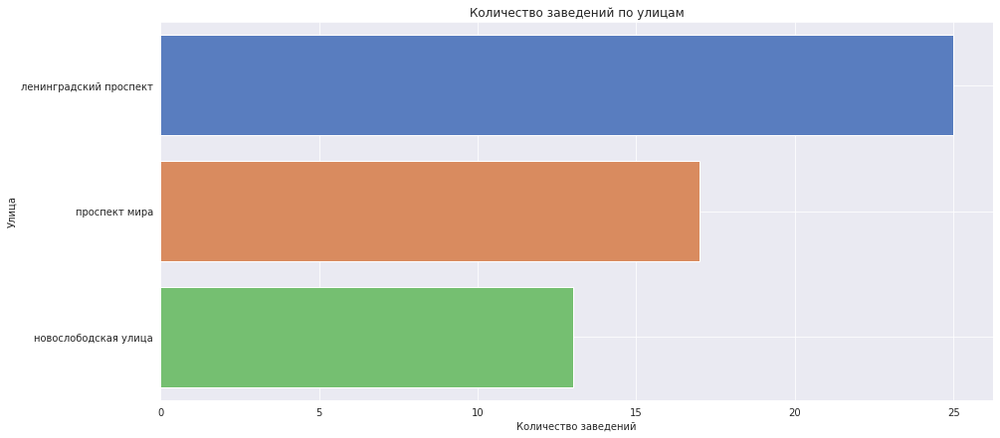

In [113]:
sns.set_style('dark') # выбираем стиль сетки
sns.set_palette('muted') # выбираем стиль палитры

plt.figure(figsize=(15, 7)) # назначаем размер графика

# строим столбчатый график средствами seaborn
sns.barplot(y=df_temp_3.index, x=df_temp_3[('name','count')], orient='h')

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Количество заведений по улицам')
plt.ylabel('Улица')
plt.xlabel('Количество заведений')

# plt.xticks(rotation=45) # поворачиваем подписи значений
# plt.yticks(rotation=45) # поворачиваем подписи значений

# plt.xlim(0, 600) # ограничиваем ось X для наглядности
# plt.ylim(0, 5000) # ограничиваем ось X для наглядности

#plt.legend() # легенда # plt.legend(loc='lower right', fontsize=10)
plt.grid() # добавляем сетку
plt.show() # отображаем график на экране

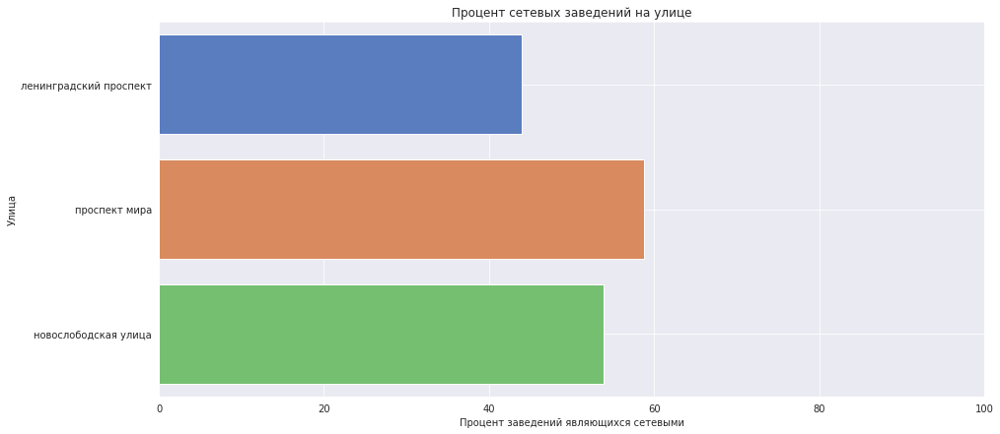

In [114]:
sns.set_style('dark') # выбираем стиль сетки
sns.set_palette('muted') # выбираем стиль палитры
plt.figure(figsize=(15, 7)) # назначаем размер графика

# строим столбчатый график средствами seaborn
sns.barplot(y=df_temp_3.index, x='persent_chein', data=df_temp_3, orient='h')

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Процент сетевых заведений на улице')
plt.xlabel('Процент заведений являющихся сетевыми')
plt.ylabel('Улица')

# plt.xticks(rotation=45) # поворачиваем подписи значений
# plt.yticks(rotation=45) # поворачиваем подписи значений

plt.xlim(0, 100) # ограничиваем ось X для наглядности
#plt.ylim(0, 100) # ограничиваем ось X для наглядности

#plt.legend() # легенда # plt.legend(loc='lower right', fontsize=10)
plt.grid() # добавляем сетку
plt.show() # отображаем график на экране

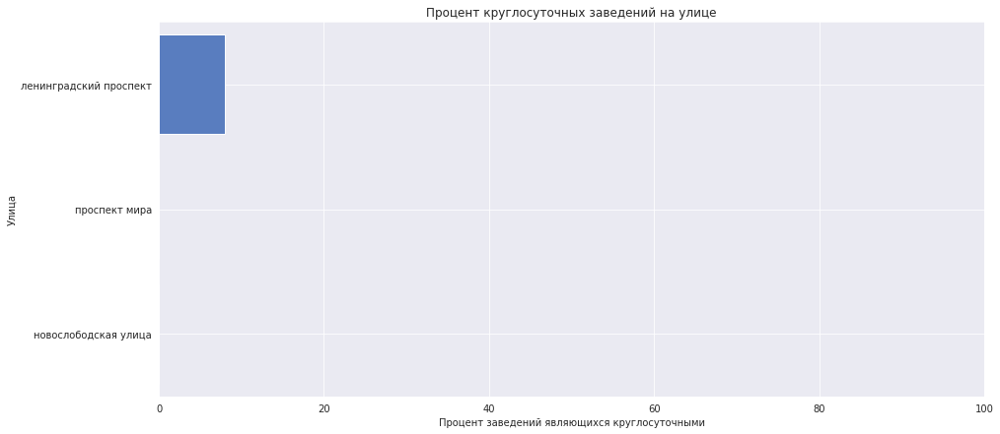

In [115]:
sns.set_style('dark') # выбираем стиль сетки
sns.set_palette('muted') # выбираем стиль палитры
plt.figure(figsize=(15, 7)) # назначаем размер графика

# строим столбчатый график средствами seaborn
sns.barplot(y=df_temp_3.index, x='persent_total', data=df_temp_3, orient='h')

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Процент круглосуточных заведений на улице')
plt.xlabel('Процент заведений являющихся круглосуточными')
plt.ylabel('Улица')

# plt.xticks(rotation=45) # поворачиваем подписи значений
# plt.yticks(rotation=45) # поворачиваем подписи значений

plt.xlim(0, 100) # ограничиваем ось X для наглядности
#plt.ylim(0, 100) # ограничиваем ось X для наглядности

#plt.legend() # легенда # plt.legend(loc='lower right', fontsize=10)
plt.grid() # добавляем сетку
plt.show() # отображаем график на экране

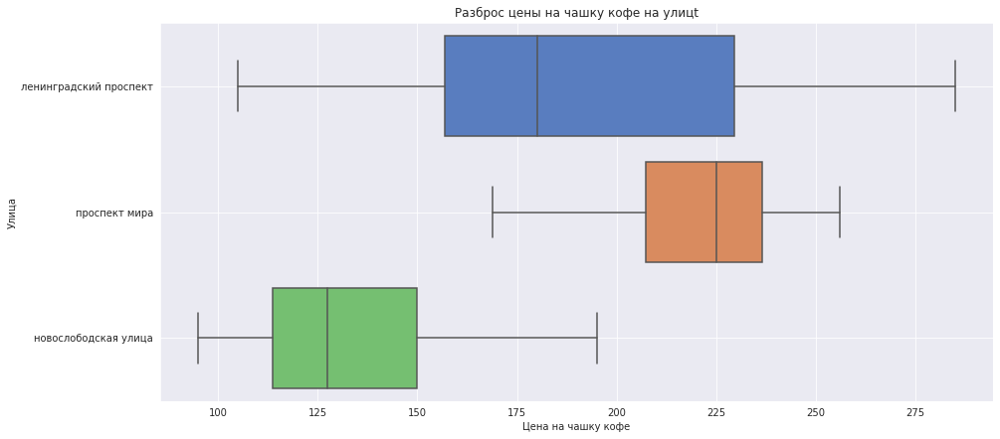

In [116]:
sns.set_style('dark') # выбираем стиль сетки
sns.set_palette('muted') # выбираем стиль палитры
plt.figure(figsize=(15, 7)) # назначаем размер графика

median_order = df_5.groupby('street')['name'].count().sort_values(ascending = False).index.tolist()
# строим столбчатый график средствами seaborn
sns.boxplot(y='street', x='middle_coffee_cup', data=df_5, orient = 'h', order=median_order)

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Разброс цены на чашку кофе на улицt')
plt.xlabel('Цена на чашку кофе')
plt.ylabel('Улица')

# plt.xticks(rotation=45) # поворачиваем подписи значений
# plt.yticks(rotation=45) # поворачиваем подписи значений

#plt.xlim(150, 300) # ограничиваем ось X для наглядности
#plt.ylim(0, 400) # ограничиваем ось X для наглядности

#plt.legend() # легенда # plt.legend(loc='lower right', fontsize=10)
plt.grid() # добавляем сетку
plt.show() # отображаем график на экране

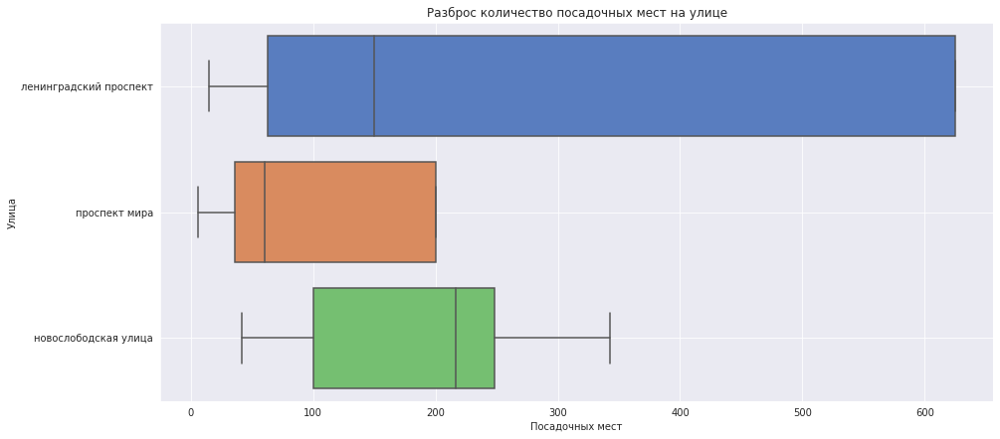

In [117]:
sns.set_style('dark') # выбираем стиль сетки
sns.set_palette('muted') # выбираем стиль палитры
plt.figure(figsize=(15, 7)) # назначаем размер графика

median_order = df_5.groupby('street')['name'].count().sort_values(ascending = False).index.tolist()
# строим столбчатый график средствами seaborn
sns.boxplot(y='street', x='seats', data=df_5, orient = 'h', order=median_order)

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Разброс количество посадочных мест на улице')
plt.xlabel('Посадочных мест')
plt.ylabel('Улица')

# plt.xticks(rotation=45) # поворачиваем подписи значений
# plt.yticks(rotation=45) # поворачиваем подписи значений

#plt.xlim(0, 650) # ограничиваем ось X для наглядности
#plt.ylim(0, 400) # ограничиваем ось X для наглядности

#plt.legend() # легенда # plt.legend(loc='lower right', fontsize=10)
plt.grid() # добавляем сетку
plt.show() # отображаем график на экране

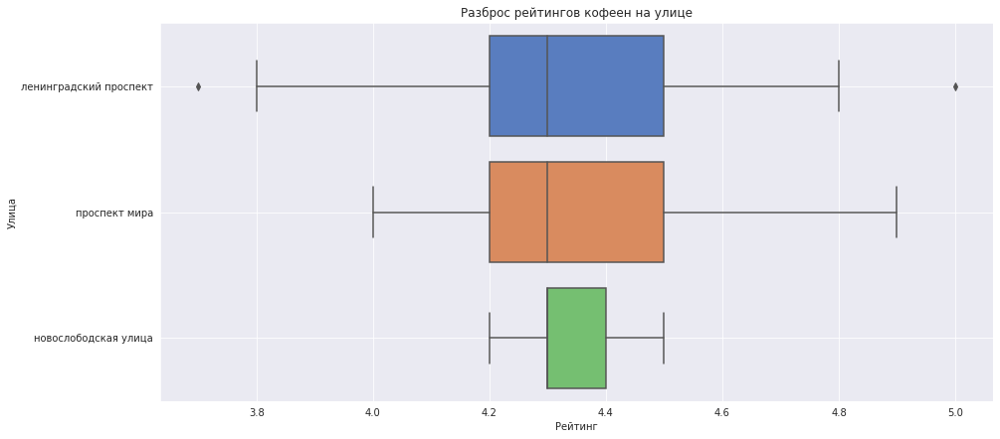

In [118]:
sns.set_style('dark') # выбираем стиль сетки
sns.set_palette('muted') # выбираем стиль палитры
plt.figure(figsize=(15, 7)) # назначаем размер графика

median_order = df_5.groupby('street')['name'].count().sort_values(ascending = False).index.tolist()
# строим столбчатый график средствами seaborn
sns.boxplot(y='street', x='rating', data=df_5, orient = 'h', order=median_order)

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Разброс рейтингов кофеен на улице')
plt.xlabel('Рейтинг')
plt.ylabel('Улица')

# plt.xticks(rotation=45) # поворачиваем подписи значений
# plt.yticks(rotation=45) # поворачиваем подписи значений

#plt.xlim(150, 300) # ограничиваем ось X для наглядности
#plt.ylim(0, 400) # ограничиваем ось X для наглядности

#plt.legend() # легенда # plt.legend(loc='lower right', fontsize=10)
plt.grid() # добавляем сетку
plt.show() # отображаем график на экране

In [119]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']}",# {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df_5.apply(create_clusters, axis=1)

# выводим карту
m

#### Выводы:
Выбрав для размещения заведений улицы: Ленинградский проспект, Проспект мира(район ЦАО), Новослободская улица сделаем выводы из имеющихся данных:

1. Количество заведений:
    - Лидером является Ленинградский проспект 25 кофеен, 
    - далее идет Проспект мира(район ЦАО) с 17 заведениями, 
    - Новослободская улица  13 заведений.
2. Сетевые заведения:
    - На Ленинградском проспекте 44% сетевых заведений, 
    - На Проспекте мира(ЦАО) (59%) и Новослободской улице(54%) более половины заведений сетевые
3. Круглосуточные заведения
    - Из представленных улиц только на Ленинградском проспекте есть 2 круглосуточных заведения, 8% от общего числа на улице
4. Стоимость средней чашки кофе
    - Ориетируясь на то что в данных есть пропуски, по средним стоимостям можно сказать только приблизительно
    - На Ленинградском проспекте медианная стоимость 180 рублей. 
    - На Проспекте мира (медиана 225) и Новослободская улица (медиана 127) количество данных по этому параметру мало, нужно больше данных.
5. Размер заведения
    - По количеству посадочных мест данных больше но они не полные:
    - На Новослободской улице заведения самые крупные медиана 217 мест
    - Далее идет Ленинградский проспект с более компактными кофейнями на 150 мест
    - Самые маленькие заведения на Проспекте мира с 60 местам.

#### Выводы
Вывод: Детализируем исследование: открытие кофейни

Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
- Абсолютный лидер – Центральный административный округ (ЦАО) с 427 кофейнями.
- Наименьшее количество заведений – в Северо-Западном округе

Есть ли круглосуточные кофейни?

1. Круглосуточные кофейни редки всего 4,1 %
2. Абсолютный лидер – Центральный административный округ (ЦАО): 25 круглосуточных заведений
3. Средние значения (от 2-9 заведений) – в ЗАО, ЮЗАО, ВАО, САО, СЗАО
4. Наименьшее количество – ЮАО и ЮВАО
5. В процентном соотношении лидеры: 
    - Юго-Западный административный округ, 
	- Западный административный округ,
	- Центральный административный округ
6. Аутсайдеры по процентном соотношении круглосуточных кофеен: 
	- Южный административный округ
    - Юго-Восточный административный округ
    - Северо-Восточный административный округ
7. Разброс относительных значений значительный: от 0,8% до 7,3%, что может указывать на существенные различия между округами.


Какие у кофеен рейтинги? Как они распределяются по районам?
1. Лидеры:
 - Центральный административный округ
 - Северо-Западный административный округ
 
2. Аутсайдеры:
 - Северо-Восточный административный округ	
 - Западный административный округ


На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?
 - Минимальная стоимость чашки кофе 60, максимальная 375.
 - Медианная стоимость чашки кофе 170
 - Большинсто кофеен установили разброс цен на чашку кофе от 124 до 225.
 - На графике видны пики около стоимости около 250, 150, и 100 рублей за чашку




Попробуйте дать рекомендацию для открытия нового заведения

Посмотрим улицы Москвы с наибольшим количеством кофеен.
Для выбора места расположения кофеен так же выберем район ЦАО, как самый конкурентный и самый дорогой район.
Посмотрим улицы Москвы и района ЦАО с наибольшим количеством кофеен и выделим в них:

1. количество кофеен на улице
2. количество сетевых кофеен
3. количество круглосуточных кофеен
4. количество и названия районов в которых располагается улица
5. для средних чашек кофе найдем:
    - минимум.
    - 25, 75 перцентили
    - медиану.
    - максимальное значение
6. медиану количество мест
7. средний рейтинг и медиану 


Для сужения вариантов размещения кофейни до 3 вариантов возьмем 2 улицы с самым большим количеством кофеен по Москве и топ 2 улицы по кофейням ЦАО как самого популярного района размещения кофеен

Проспек мира попадает в оба списка, оставим для этой улицы только те кофейни, которые располагаются в ЦАО
Так же в список возьмем вторую по популярности улицу Москвы : ленинградский проспект 25 кофеен
Третьим вариантом возьмем 2 по популярности улицу ЦАО: новослободская улица 13 кофеен


Выбрав для размещения заведений улицы: Ленинградский проспект, Проспект мира(район ЦАО), Новослободская улица сделаем выводы из имеющихся данных:

1. Количество заведений:
    - Лидером является Ленинградский проспект 25 кофеен, 
    - далее идет Проспект мира(район ЦАО) с 17 заведениями, 
    - Новослободская улица  13 заведений.
2. Сетевые заведения:
    - На Ленинградском проспекте 44% сетевых заведений, 
    - На Проспекте мира(ЦАО) (59%) и Новослободской улице(54%) более половины заведений сетевые
3. Круглосуточные заведения
    - Из представленных улиц только на Ленинградском проспекте есть 2 круглосуточных заведения, 8% от общего числа на улице
4. Стоимость средней чашки кофе
    - Ориетируясь на то что в данных есть пропуски, по средним стоимостям можно сказать только приблизительно
    - На Ленинградском проспекте медианная стоимость 180 рублей. 
    - На Проспекте мира (медиана 225) и Новослободская улица (медиана 127) количество данных по этому параметру мало, нужно больше данных.
5. Размер заведения
    - По количеству посадочных мест данных больше но они не полные:
    - На Новослободской улице заведения самые крупные медиана 217 мест
    - Далее идет Ленинградский проспект с более компактными кофейнями на 150 мест
    - Самые маленькие заведения на Проспекте мира с 60 местам.


